In [15]:
import scanpy as sc
import scirpy as ir

import pandas as pd
import os

def load_trb(sample, gex_h5, vdj_file, clonotype_file):
    adata = sc.read_10x_h5(gex_h5)
    contigs = pd.read_csv(vdj_file)
    barcodes = dict()
    for barcode, clonotype in zip(contigs["barcode"],contigs["raw_clonotype_id"]):
        barcodes[barcode] = clonotype    
    assert os.path.exists(clonotype_file)
    clonotypes = pd.read_csv(clonotype_file)
    print(clonotypes.columns.tolist())
    seqs = dict()
    inkt = dict()
    mait = dict()
    for clonotype, seq in zip(clonotypes["clonotype_id"],clonotypes["cdr3s_aa"]):
        seqs[clonotype] = seq
    for clonotype, seq in zip(clonotypes["clonotype_id"],clonotypes["inkt_evidence"]):
        inkt[clonotype] = seq
    for clonotype, seq in zip(clonotypes["clonotype_id"],clonotypes["mait_evidence"]):
        mait[clonotype] = seq
    trbs = []
    maits = []
    inkts = []
    for barcode in adata.obs.index:
        if barcode in barcodes:
            maits.append(mait[barcodes[barcode]])
            inkts.append(inkt[barcodes[barcode]])
            seq = seqs[barcodes[barcode]]
            if "TRB:" not in seq:
                trbs.append("None")
            else:
                flag = False
                chains = seq.split(";")
                for chain in chains:
                    if "TRB:" in chain:
                        trbs.append(chain.replace("TRB:",""))
                        flag = True
                        break
                if not flag: print("BAD")
        else:
            trbs.append("None")
            maits.append("None")
            inkts.append("None")
    adata.obs['mait'] = maits
    adata.obs['inkt'] = inkts
    
    tras = []
    for barcode in adata.obs.index:
        if barcode in barcodes:
            seq = seqs[barcodes[barcode]]
            if "TRA:" not in seq:
                tras.append("None")
            else:
                flag = False
                chains = seq.split(";")
                for chain in chains:
                    if "TRA:" in chain:
                        tras.append(chain.replace("TRA:",""))
                        flag = True
                        break
                if not flag: print("BAD")
        else:
            tras.append("None")
    
    adata.obs['trb'] = trbs
    adata.obs['tra'] = tras
    adata.var_names_make_unique()
    print(sample,"complete",len(set(adata.obs["trb"])))
    return adata.copy()

from scipy import sparse
import numpy as np
import pandas as pd
import scanpy as sc
import collections
import warnings
warnings.filterwarnings('ignore')


# ============================================================
# CORE CLASSIFIER
# ============================================================

def normalized_exponential_vector(values, temperature=0.01):
    exps = np.exp(values / temperature)
    return exps / np.sum(exps)


def _score_cell(adata, idx, genes):
    expr = []
    for gene in genes:
        if gene in adata.var_names:
            val = adata.X[idx, adata.var_names.get_loc(gene)]
            if sparse.issparse(adata.X):
                val = val.toarray().flatten()[0] if hasattr(val, 'toarray') else val
            expr.append(val)
    return np.mean(expr) if expr else 0


def classify_recursive(adata, markers, temperature=0.01, key="phenotype"):
    level1_markers = {ct: info["markers"] for ct, info in markers.items()}
    for ct, genes in level1_markers.items():
        sc.tl.score_genes(adata, score_name=f"{ct}_L1_SCORE", gene_list=genes)

    level1_mat = adata.obs[[f"{ct}_L1_SCORE" for ct in markers]].to_numpy()
    level1_types = []
    for x in level1_mat:
        probs = normalized_exponential_vector(x, temperature=temperature)
        level1_types.append(list(markers.keys())[np.argmax(probs)])
    adata.obs["phenotype_level1"] = level1_types

    n_cells = adata.n_obs
    final_labels = [""] * n_cells

    def _classify_level(cell_indices, subtypes_dict, prefix, depth):
        if not cell_indices:
            return
        subtype_names = list(subtypes_dict.keys())
        is_leaf = {st: isinstance(subtypes_dict[st], list) for st in subtype_names}
        for i in cell_indices:
            scores = []
            for st in subtype_names:
                genes = subtypes_dict[st] if is_leaf[st] else subtypes_dict[st]["markers"]
                scores.append(_score_cell(adata, i, genes))
            probs = normalized_exponential_vector(np.array(scores), temperature=temperature)
            best = subtype_names[np.argmax(probs)]
            if is_leaf[best]:
                final_labels[i] = f"{prefix}_{best}"
            else:
                _classify_level([i], subtypes_dict[best]["subtypes"], f"{prefix}_{best}", depth + 1)

    l1_groups = collections.defaultdict(list)
    for i, l1 in enumerate(level1_types):
        l1_groups[l1].append(i)
    for l1_type, indices in l1_groups.items():
        if "subtypes" in markers[l1_type]:
            _classify_level(indices, markers[l1_type]["subtypes"], l1_type, 2)
        else:
            for i in indices:
                final_labels[i] = l1_type
    adata.obs[key] = final_labels
    return adata


# ============================================================
# TEMRA POST-HOC GATE
# ============================================================

def apply_temra_gate(adata, key="phenotype"):
    cx3cr1 = adata[:, "CX3CR1"].X.toarray().flatten() if sparse.issparse(adata.X) else adata[:, "CX3CR1"].X.flatten()
    s1pr5 = adata[:, "S1PR5"].X.toarray().flatten() if sparse.issparse(adata.X) else adata[:, "S1PR5"].X.flatten()
    klf2 = adata[:, "KLF2"].X.toarray().flatten() if sparse.issparse(adata.X) else adata[:, "KLF2"].X.flatten()
    mask = adata.obs[key] == "CD8_Activated_TEXeff"
    temra_gate = mask & (cx3cr1 > 0) & ((s1pr5 > 0) | (klf2 > 1.0))
    n_temra = temra_gate.sum()
    adata.obs.loc[temra_gate, key] = "CD8_Activated_TEMRA"
    return n_temra


# ============================================================
# LINEAGE SWITCHING CORRECTION
# ============================================================

def correct_lineage_switching(adata, markers, clone_key="trb", key="phenotype", temperature=0.01):
    tcr = adata.obs[adata.obs[clone_key].notna()].copy()
    tcr["_lineage"] = tcr[key].apply(lambda x: "CD8" if "CD8" in x else "CD4")

    clone_lineage = tcr.groupby(clone_key)["_lineage"].nunique()
    switching = clone_lineage[clone_lineage > 1].index
    sw = tcr[tcr[clone_key].isin(switching)]

    if len(switching) == 0:
        print("No switching clones found.")
        return 0

    clone_majority = sw.groupby(clone_key)["_lineage"].agg(lambda x: x.mode().iloc[0] if len(x) > 0 else None).dropna()

    # Find minority cells
    fix_map = {}
    for clone, majority_lin in clone_majority.items():
        clone_cells = sw[sw[clone_key] == clone]
        minority = clone_cells[clone_cells["_lineage"] != majority_lin]
        for bc in minority.index:
            fix_map[bc] = majority_lin

    if not fix_map:
        print("No cells to reclassify.")
        return 0

    fix_barcodes = list(fix_map.keys())
    print(f"Cells to reclassify: {len(fix_barcodes)}")
    print(f"Direction: {pd.Series(fix_map).value_counts().to_dict()}")

    # Reclassify each cell within its corrected lineage
    cd4_subtypes = {st: genes for st, genes in markers["CD4"]["subtypes"].items()}
    cd8_subtypes = markers["CD8"]["subtypes"]
    act_markers = cd8_subtypes["Activated"]["markers"]
    qui_markers = cd8_subtypes["Quiescent"]["markers"]
    cd8_act = cd8_subtypes["Activated"]["subtypes"]
    cd8_qui = cd8_subtypes["Quiescent"]["subtypes"]

    new_labels = {}
    for bc in fix_barcodes:
        idx = adata.obs.index.get_loc(bc)
        corrected_lin = fix_map[bc]

        if corrected_lin == "CD8":
            act_score = np.mean([_score_cell(adata, idx, [g]) for g in act_markers])
            qui_score = np.mean([_score_cell(adata, idx, [g]) for g in qui_markers])
            if act_score > qui_score:
                scores = {st: _score_cell(adata, idx, genes) for st, genes in cd8_act.items()}
                best = max(scores, key=scores.get)
                new_labels[bc] = f"CD8_Activated_{best}"
            else:
                scores = {st: _score_cell(adata, idx, genes) for st, genes in cd8_qui.items()}
                best = max(scores, key=scores.get)
                new_labels[bc] = f"CD8_Quiescent_{best}"
        else:
            scores = {st: _score_cell(adata, idx, genes) for st, genes in cd4_subtypes.items()}
            best = max(scores, key=scores.get)
            new_labels[bc] = f"CD4_{best}"

    for bc, label in new_labels.items():
        adata.obs.loc[bc, key] = label

    return len(fix_barcodes)


# ============================================================
# MARKER DEFINITIONS
# ============================================================

def load_markers(beltra_path="41586_2025_9989_MOESM10_ESM.xlsx"):
    df_sig = pd.read_excel(beltra_path, header=None)
    tex = df_sig.iloc[3:, :2].dropna()
    tex.columns = ["gene", "signature"]
    trm = df_sig.iloc[3:, 3:5].dropna()
    trm.columns = ["gene", "signature"]
    gene_sigs = {}
    for sig in tex["signature"].unique():
        gene_sigs[sig] = tex[tex["signature"] == sig]["gene"].tolist()
    for sig in trm["signature"].unique():
        gene_sigs[sig] = trm[trm["signature"] == sig]["gene"].tolist()
    to_human = lambda genes: [g.upper() for g in genes]

    return {
        "CD8": {
            "markers": ["CD8A", "CD8B"],
            "subtypes": {
                "Activated": {
                    "markers": ["NKG7", "GZMB", "PRF1", "GNLY", "CST7"],
                    "subtypes": {
                        "TEXeff": to_human(gene_sigs["TEX eff-like"]),
                        "TEXterm": to_human(gene_sigs["TEXterm"]),
                        "TRM": to_human(gene_sigs["TRM UP"]),
                    }
                },
                "Quiescent": {
                    "markers": ["TCF7", "SELL", "IL7R", "LEF1", "CCR7"],
                    "subtypes": {
                        "Naive": ["CCR7", "SELL", "LEF1", "MAL", "BACH2"],
                        "TEXprog": to_human(gene_sigs["TEXprog"]),
                        "Memory": ["GZMK", "EOMES", "GZMA", "GZMB"],
                    }
                },
            }
        },
        "CD4": {
            "markers": ["CD4"],
            "subtypes": {
                "Naive_Memory": ["IL7R", "TCF7", "MAL", "LEF1"],
                "Exhausted": ["PDCD1", "LAG3", "TIGIT", "TOX", "CXCL13", "CTLA4"],
                "Treg": ["FOXP3", "IL32", "CTLA4", "IKZF2", "IL2RA", "ICOS",
                         "ARID5B", "IL2RG", "TIGIT", "TNFRSF1B"],
                "Th1_polarized": ["TBX21", "STAT1", "CXCR3", "IFNG", "IL12RB2"],
                "Th2_polarized": ["GATA3", "STAT6", "IL4", "IL4R"],
            }
        },
    }


# ============================================================
# FULL PIPELINE
# ============================================================

def phenotype_tcells(adata, beltra_path="41586_2025_9989_MOESM10_ESM.xlsx",
                     clone_key="trb", key="phenotype", temperature=0.01):
    markers = load_markers(beltra_path)

    # Step 1: Hierarchical classifier
    print("=" * 60)
    print("STEP 1: Hierarchical classifier")
    print("=" * 60)
    classify_recursive(adata, markers, temperature=temperature, key=key)
    print(adata.obs[key].value_counts())

    # Step 2: Post-hoc TEMRA gate
    print("\n" + "=" * 60)
    print("STEP 2: Post-hoc TEMRA gate (CX3CR1+ AND S1PR5/KLF2)")
    print("=" * 60)
    n_temra = apply_temra_gate(adata, key=key)
    print(f"TEMRA cells gated: {n_temra}")
    print(adata.obs[key].value_counts())

    # Step 3: Lineage switching correction
    print("\n" + "=" * 60)
    print("STEP 3: TCR lineage switching correction")
    print("=" * 60)
    n_fixed = correct_lineage_switching(adata, markers, clone_key=clone_key,
                                         key=key, temperature=temperature)
    # Re-apply TEMRA gate on reclassified cells
    if n_fixed > 0:
        n_temra2 = apply_temra_gate(adata, key=key)
        print(f"Post-correction TEMRA gate: {n_temra2} additional")
    print(f"\nFinal phenotypes:")
    print(adata.obs[key].value_counts())

    # Step 4: Verify
    print("\n" + "=" * 60)
    print("VERIFICATION")
    print("=" * 60)
    _verify(adata, clone_key=clone_key, key=key)

    return adata


def _verify(adata, clone_key="trb", key="phenotype"):
    # Remaining switching clones
    tcr = adata.obs[adata.obs[clone_key].notna()].copy()
    tcr["_lin"] = tcr[key].apply(lambda x: "CD8" if "CD8" in x else "CD4")
    cl = tcr.groupby(clone_key)["_lin"].nunique()
    n_sw = (cl > 1).sum()
    print(f"Remaining switching clones: {n_sw}")

    # Tissue distribution
    print("\nTissue distribution:")
    ct = pd.crosstab(adata.obs[key], adata.obs["tissue"], normalize="index")
    print(ct.round(2))

    # Key markers per phenotype
    check = ["CX3CR1", "S1PR5", "KLF2", "CD69", "PDCD1", "TOX", "TCF7", "FOXP3"]
    check = [g for g in check if g in adata.var_names]
    print(f"\nKey marker means:")
    rows = []
    for pheno in sorted(adata.obs[key].unique()):
        sub = adata[adata.obs[key] == pheno]
        row = {"phenotype": pheno, "n": sub.n_obs}
        for g in check:
            v = sub[:, g].X.toarray().mean() if sparse.issparse(sub.X) else sub[:, g].X.mean()
            row[g] = round(v, 2)
        rows.append(row)
    print(pd.DataFrame(rows).set_index("phenotype").to_string())

    # TEMRA sanity
    temra = adata[adata.obs[key] == "CD8_Activated_TEMRA"]
    if temra.n_obs > 0:
        pbmc_frac = (temra.obs["tissue"].astype(str) == "PBMC").mean()
        print(f"\nTEMRA: {temra.n_obs} cells, {pbmc_frac:.0%} PBMC")


def annotate(adata):
    adata.obs["patient"] = [x.split("-")[1] for x in adata.obs["sample"]]
    adata.obs["timepoint"] = [x.split("-")[2] for x in adata.obs["sample"]]
    adata.obs["tissue"] = [x.split("-")[-1] for x in adata.obs["sample"]]

    tp_mapper = {
        'S3': '3',
        'S4': '4', 
        'S6': '6',
        'S5': '5',
        'S2': '2',
        'S1': '1',
        '001': '1'
    }

    pat = []
    for x in adata.obs["patient"]:
        if x == "GBM":
            pat.append("MSK1")
        else:
            pat.append(x)
    adata.obs["patient"] = pat

    adata.obs["timepoint"] = [tp_mapper[x] for x in adata.obs["timepoint"]]
    stats = set(adata.obs["patient"]), set(adata.obs["timepoint"]), set(adata.obs["tissue"])
    print(stats)
    return adata.copy()

# ============================================================
# RUN
# ============================================================

# phenotype_tcells(adata, beltra_path="41586_2025_9989_MOESM10_ESM.xlsx")

In [2]:
directory = "/Users/ceglian/Codebase/GitHub/gbm_trafficking/data/btc_gbm_gex_vdj/"

In [3]:
import glob
import os
def load_directory(directory):
    path = os.path.join(directory, "*.h5")
    adatas = []
    samples = []
    for x in glob.glob(path):
        vdj_file = x.replace(".h5",".csv")
        adata = sc.read_10x_h5(x)
        vdj = ir.io.read_10x_vdj(vdj_file)
        ir.pp.merge_with_ir(adata,vdj)
        adata.var_names_make_unique()
        adatas.append(adata)
        sample = os.path.split(x)[1].replace(".h5","")
        samples.append(sample)
        print(sample, "Loaded.")
    adata = adatas[0].concatenate(adatas[1:], batch_key="sample", batch_categories=samples)
    return adata

adata_scirpy = load_directory(directory)
adata_scirpy

GBM1-DFCI5-S5-L6-TP Loaded.
GBM1-MSK1-S4-CSF Loaded.
GBM1-DFCI4-S1-TP Loaded.
GBM1-DFCI5-S1-TP Loaded.
BTC-GBM-001-003-TP Loaded.
GBM1-DFCI4-S6-L6-TP Loaded.
GBM1-DFCI3-S3-PBMC Loaded.
GBM1-DFCI3-S3-L2-TP Loaded.
GBM1-DFCI4-S1-PBMC Loaded.
GBM1-DFCI4-S6-L4-TP Loaded.
BTC-GBM-001-001-TP Loaded.
GBM1-DFCI5-S5-L4-TP Loaded.
GBM1-DFCI5-S3-TP Loaded.
GBM1-DFCI5-S2-CSF Loaded.
GBM1-DFCI2-S2-TP Loaded.
GBM1-DFCI3-S4-L2D-TP Loaded.
GBM1-DFCI2-S6-L1-TP Loaded.
GBM1-DFCI3-S2-CSF Loaded.
GBM1-DFCI3-S2-PBMC Loaded.
GBM1-DFCI3-S5-L1-TP Loaded.
GBM1-DFCI3-S4-L1-TP Loaded.
GBM1-DFCI5-S5-L2-TP Loaded.
GBM1-DFCI5-S4-L2-TP Loaded.
GBM1-DFCI4-S6-L5-TP Loaded.
GBM1-DFCI1-S3-PBMC Loaded.
GBM1-DFCI4-S2-PBMC Loaded.
GBM1-DFCI4-S2-TP Loaded.
GBM1-DFCI5-S2-TP Loaded.
GBM1-DFCI5-S5-L5-TP Loaded.
GBM1-DFCI5-S4-PBMC Loaded.
BTC-GBM-001-002-TP Loaded.
GBM1-DFCI3-S3-L1-TP Loaded.
GBM1-MSK1-S2-CSF Loaded.
GBM1-DFCI4-S2-CSF Loaded.
GBM1-DFCI4-S6-L7-TP Loaded.
GBM1-DFCI2-S1-TP Loaded.
GBM1-DFCI4-S6-L3-TP Loaded.
GBM1-

AnnData object with n_obs × n_vars = 632608 × 31915
    obs: 'is_cell', 'high_confidence', 'multi_chain', 'extra_chains', 'IR_VJ_1_c_call', 'IR_VJ_2_c_call', 'IR_VDJ_1_c_call', 'IR_VDJ_2_c_call', 'IR_VJ_1_consensus_count', 'IR_VJ_2_consensus_count', 'IR_VDJ_1_consensus_count', 'IR_VDJ_2_consensus_count', 'IR_VJ_1_d_call', 'IR_VJ_2_d_call', 'IR_VDJ_1_d_call', 'IR_VDJ_2_d_call', 'IR_VJ_1_duplicate_count', 'IR_VJ_2_duplicate_count', 'IR_VDJ_1_duplicate_count', 'IR_VDJ_2_duplicate_count', 'IR_VJ_1_j_call', 'IR_VJ_2_j_call', 'IR_VDJ_1_j_call', 'IR_VDJ_2_j_call', 'IR_VJ_1_junction', 'IR_VJ_2_junction', 'IR_VDJ_1_junction', 'IR_VDJ_2_junction', 'IR_VJ_1_junction_aa', 'IR_VJ_2_junction_aa', 'IR_VDJ_1_junction_aa', 'IR_VDJ_2_junction_aa', 'IR_VJ_1_locus', 'IR_VJ_2_locus', 'IR_VDJ_1_locus', 'IR_VDJ_2_locus', 'IR_VJ_1_productive', 'IR_VJ_2_productive', 'IR_VDJ_1_productive', 'IR_VDJ_2_productive', 'IR_VJ_1_v_call', 'IR_VJ_2_v_call', 'IR_VDJ_1_v_call', 'IR_VDJ_2_v_call', 'has_ir', 'sample'
    var

In [16]:
import glob
import os
def load_directory(directory):
    path = os.path.join(directory, "*.h5")
    adatas = []
    samples = []
    for x in glob.glob(path):
        print(x)
        sample = os.path.split(x)[1].replace(".h5","")
        vdj_file = x.replace(".h5",".csv")
        clonotype_file = vdj_file.replace(".csv","_clonotypes.csv")
        print(clonotype_file)
        adata = load_trb(sample, x, vdj_file, clonotype_file)
        adata.var_names_make_unique()
        adatas.append(adata)
        samples.append(sample)
        print(sample, "Loaded.")
    adata = adatas[0].concatenate(adatas[1:], batch_key="sample", batch_categories=samples)
    return adata

adata_manual = load_directory(directory)
adata_manual

/Users/ceglian/Codebase/GitHub/gbm_trafficking/data/btc_gbm_gex_vdj/GBM1-DFCI5-S5-L6-TP.h5
/Users/ceglian/Codebase/GitHub/gbm_trafficking/data/btc_gbm_gex_vdj/GBM1-DFCI5-S5-L6-TP_clonotypes.csv
['clonotype_id', 'frequency', 'proportion', 'cdr3s_aa', 'cdr3s_nt', 'inkt_evidence', 'mait_evidence']
GBM1-DFCI5-S5-L6-TP complete 490
GBM1-DFCI5-S5-L6-TP Loaded.
/Users/ceglian/Codebase/GitHub/gbm_trafficking/data/btc_gbm_gex_vdj/GBM1-MSK1-S4-CSF.h5
/Users/ceglian/Codebase/GitHub/gbm_trafficking/data/btc_gbm_gex_vdj/GBM1-MSK1-S4-CSF_clonotypes.csv
['clonotype_id', 'frequency', 'proportion', 'cdr3s_aa', 'cdr3s_nt', 'inkt_evidence', 'mait_evidence']
GBM1-MSK1-S4-CSF complete 965
GBM1-MSK1-S4-CSF Loaded.
/Users/ceglian/Codebase/GitHub/gbm_trafficking/data/btc_gbm_gex_vdj/GBM1-DFCI4-S1-TP.h5
/Users/ceglian/Codebase/GitHub/gbm_trafficking/data/btc_gbm_gex_vdj/GBM1-DFCI4-S1-TP_clonotypes.csv
['clonotype_id', 'frequency', 'proportion', 'cdr3s_aa', 'cdr3s_nt', 'inkt_evidence', 'mait_evidence']
GBM1-DFC

AnnData object with n_obs × n_vars = 632608 × 31915
    obs: 'mait', 'inkt', 'trb', 'tra', 'sample'
    var: 'feature_types', 'genome', 'gene_ids-BTC-GBM-001-001-TP', 'gene_ids-BTC-GBM-001-002-TP', 'gene_ids-BTC-GBM-001-003-TP', 'gene_ids-BTC-GBM-001-004-TP', 'gene_ids-BTC-GBM-001-005-L3-TP', 'gene_ids-GBM1-DFCI1-S3-PBMC', 'gene_ids-GBM1-DFCI1-S4-PBMC', 'gene_ids-GBM1-DFCI2-S1-PBMC', 'gene_ids-GBM1-DFCI2-S1-TP', 'gene_ids-GBM1-DFCI2-S2-TP', 'gene_ids-GBM1-DFCI2-S3-TP', 'gene_ids-GBM1-DFCI2-S4-L1D-TP', 'gene_ids-GBM1-DFCI2-S5-L1-TP', 'gene_ids-GBM1-DFCI2-S5-L2-TP', 'gene_ids-GBM1-DFCI2-S6-L1-TP', 'gene_ids-GBM1-DFCI2-S6-L2-TP', 'gene_ids-GBM1-DFCI3-S1-CSF', 'pattern-GBM1-DFCI3-S1-CSF', 'read-GBM1-DFCI3-S1-CSF', 'sequence-GBM1-DFCI3-S1-CSF', 'gene_ids-GBM1-DFCI3-S1-L1-TP', 'gene_ids-GBM1-DFCI3-S1-L2-TP', 'gene_ids-GBM1-DFCI3-S1-PBMC', 'gene_ids-GBM1-DFCI3-S2-CSF', 'pattern-GBM1-DFCI3-S2-CSF', 'read-GBM1-DFCI3-S2-CSF', 'sequence-GBM1-DFCI3-S2-CSF', 'gene_ids-GBM1-DFCI3-S2-PBMC', 'gene_ids

In [17]:
adata_manual = annotate(adata_manual)
# adata_scirpy = annotate(adata_scirpy)

({'DFCI4', 'DFCI3', 'DFCI2', 'DFCI5', 'MSK1', 'DFCI1'}, {'4', '3', '2', '1', '5', '6'}, {'TP', 'PBMC', 'CSF'})


In [9]:
adata_scirpy.obs['trb'] = [str(x) for x in adata_scirpy.obs["IR_VDJ_1_junction_aa"]]
adata_scirpy = adata_scirpy[adata_scirpy.obs["has_ir"] == "True"].copy()
adata_scirpy = adata_scirpy[adata_scirpy.obs["trb"]!="nan"].copy()
adata_scirpy

AnnData object with n_obs × n_vars = 151878 × 31915
    obs: 'is_cell', 'high_confidence', 'multi_chain', 'extra_chains', 'IR_VJ_1_c_call', 'IR_VJ_2_c_call', 'IR_VDJ_1_c_call', 'IR_VDJ_2_c_call', 'IR_VJ_1_consensus_count', 'IR_VJ_2_consensus_count', 'IR_VDJ_1_consensus_count', 'IR_VDJ_2_consensus_count', 'IR_VJ_1_d_call', 'IR_VJ_2_d_call', 'IR_VDJ_1_d_call', 'IR_VDJ_2_d_call', 'IR_VJ_1_duplicate_count', 'IR_VJ_2_duplicate_count', 'IR_VDJ_1_duplicate_count', 'IR_VDJ_2_duplicate_count', 'IR_VJ_1_j_call', 'IR_VJ_2_j_call', 'IR_VDJ_1_j_call', 'IR_VDJ_2_j_call', 'IR_VJ_1_junction', 'IR_VJ_2_junction', 'IR_VDJ_1_junction', 'IR_VDJ_2_junction', 'IR_VJ_1_junction_aa', 'IR_VJ_2_junction_aa', 'IR_VDJ_1_junction_aa', 'IR_VDJ_2_junction_aa', 'IR_VJ_1_locus', 'IR_VJ_2_locus', 'IR_VDJ_1_locus', 'IR_VDJ_2_locus', 'IR_VJ_1_productive', 'IR_VJ_2_productive', 'IR_VDJ_1_productive', 'IR_VDJ_2_productive', 'IR_VJ_1_v_call', 'IR_VJ_2_v_call', 'IR_VDJ_1_v_call', 'IR_VDJ_2_v_call', 'has_ir', 'sample', 'patie

In [18]:
adata_manual = adata_manual[adata_manual.obs["trb"]!="None"].copy()
adata_manual

AnnData object with n_obs × n_vars = 152643 × 31915
    obs: 'mait', 'inkt', 'trb', 'tra', 'sample', 'patient', 'timepoint', 'tissue'
    var: 'feature_types', 'genome', 'gene_ids-BTC-GBM-001-001-TP', 'gene_ids-BTC-GBM-001-002-TP', 'gene_ids-BTC-GBM-001-003-TP', 'gene_ids-BTC-GBM-001-004-TP', 'gene_ids-BTC-GBM-001-005-L3-TP', 'gene_ids-GBM1-DFCI1-S3-PBMC', 'gene_ids-GBM1-DFCI1-S4-PBMC', 'gene_ids-GBM1-DFCI2-S1-PBMC', 'gene_ids-GBM1-DFCI2-S1-TP', 'gene_ids-GBM1-DFCI2-S2-TP', 'gene_ids-GBM1-DFCI2-S3-TP', 'gene_ids-GBM1-DFCI2-S4-L1D-TP', 'gene_ids-GBM1-DFCI2-S5-L1-TP', 'gene_ids-GBM1-DFCI2-S5-L2-TP', 'gene_ids-GBM1-DFCI2-S6-L1-TP', 'gene_ids-GBM1-DFCI2-S6-L2-TP', 'gene_ids-GBM1-DFCI3-S1-CSF', 'pattern-GBM1-DFCI3-S1-CSF', 'read-GBM1-DFCI3-S1-CSF', 'sequence-GBM1-DFCI3-S1-CSF', 'gene_ids-GBM1-DFCI3-S1-L1-TP', 'gene_ids-GBM1-DFCI3-S1-L2-TP', 'gene_ids-GBM1-DFCI3-S1-PBMC', 'gene_ids-GBM1-DFCI3-S2-CSF', 'pattern-GBM1-DFCI3-S2-CSF', 'read-GBM1-DFCI3-S2-CSF', 'sequence-GBM1-DFCI3-S2-CSF', 'gene_

In [20]:
adata_manual = adata_manual[adata_scirpy.obs.index].copy()
adata_scirpy.obs["mait"] = adata_manual.obs["mait"]
adata_scirpy.obs["inkt"] = adata_manual.obs["inkt"]
adata_scirpy.obs["trb_all"] = adata_manual.obs["trb"]
adata_scirpy.obs["tra_all"] = adata_manual.obs["tra"]


In [23]:
adata = adata_scirpy[adata_scirpy.obs["trb"]!="nan"].copy()

In [25]:
adata.write("tcr_pos_tcells.h5ad")

In [32]:
adata=sc.read_h5ad("tcr_pos_tcells.h5ad")
adata.layers["counts"] = adata.X

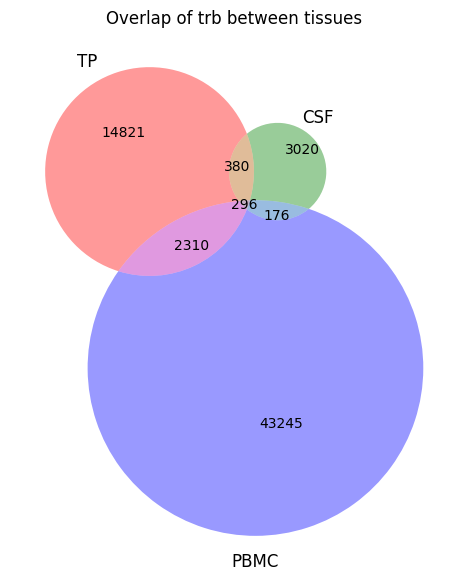

In [33]:
df = adata.obs[["patient", "timepoint", "tissue", "trb"]]

# Get unique trb values per tissue
tissue_trb = {
    tissue: set(df.loc[df["tissue"] == tissue, "trb"].dropna())
    for tissue in df["tissue"].unique()
}

import matplotlib.pyplot as plt
from matplotlib_venn import venn3

# Only plot for up to 3 tissues (Venn diagrams cannot handle more than 3)
tissues = list(tissue_trb.keys())
if len(tissues) < 2:
    print("Not enough tissues for Venn diagram.")
elif len(tissues) == 2:
    from matplotlib_venn import venn2
    plt.figure(figsize=(6,6))
    venn2([tissue_trb[tissues[0]], tissue_trb[tissues[1]]], set_labels=(tissues[0], tissues[1]))
    plt.title("Overlap of trb between tissues")
    plt.show()
else:
    # Pick 3 tissues to visualize, e.g., the first 3 by default
    plt.figure(figsize=(7,7))
    venn3([tissue_trb[tissues[0]], tissue_trb[tissues[1]], tissue_trb[tissues[2]]], set_labels=(tissues[0], tissues[1], tissues[2]))
    plt.title("Overlap of trb between tissues")
    plt.show()

<Axes: xlabel='clone_size', ylabel='Count'>

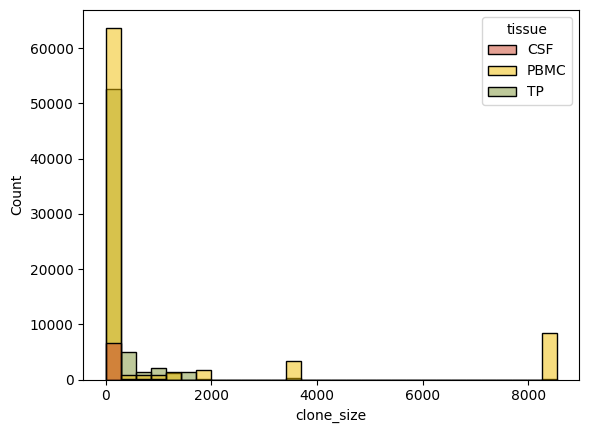

In [34]:
import stcr
import tcri
import seaborn as sns

stcr.pp.register_clonotype_key(adata,"trb")
stcr.pp.clone_size(adata)
sns.histplot(data=adata.obs, x="clone_size", hue="tissue",bins=30)


100%|██████████| 31915/31915 [00:27<00:00, 1148.54it/s]


<Axes: xlabel='entropy', ylabel='Count'>

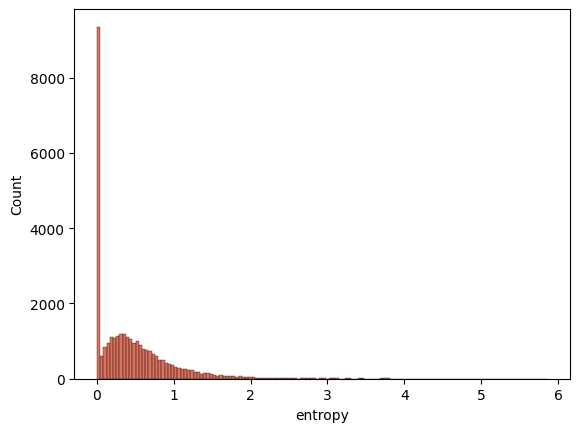

In [35]:
import tqdm
from scipy.stats import entropy
import numpy as np

def gene_entropy(adata, key_added="entropy"):
    X = adata.layers["counts"].todense()
    X = np.array(X.T)
    gene_to_row = list(zip(adata.var.index.tolist(), X))
    entropies = []
    for _, exp in tqdm.tqdm(gene_to_row):
        counts = np.unique(exp, return_counts = True)
        entropies.append(entropy(counts[1][1:]))
    adata.var[key_added] = entropies
gene_entropy(adata)
sns.histplot(adata.var["entropy"])

In [36]:
import scanpy.external as sce
def remove_meaningless_genes(adata, include_mt=True, include_rp=True, include_mtrn=True, include_hsp=True, include_tcr=False):
    genes = [x for x in adata.var.index.tolist() if "RIK" not in x.upper()]
    genes = [x for x in genes if "GM" not in x]
    genes = [x for x in genes if "-" not in x or "HLA" in x]
    genes = [x for x in genes if "." not in x or "HLA" in x]
    genes = [x for x in genes if "LINC" not in x.upper()]
    if include_mtrn:
        genes = [x for x in genes if "MTRN" not in x]
    if include_hsp:
        genes = [x for x in genes if "HSP" not in x]
    if include_mt:
        genes = [x for x in genes if "MT-" not in x.upper()]
    if include_rp:
        genes = [x for x in genes if "RP" not in x.upper()]
    if include_tcr:
        genes = [x for x in genes if "TRAV" not in x]
        genes = [x for x in genes if "TRAJ" not in x]
        genes = [x for x in genes if "TRAD" not in x]

        genes = [x for x in genes if "TRBV" not in x]
        genes = [x for x in genes if "TRBJ" not in x]
        genes = [x for x in genes if "TRBD" not in x]

        genes = [x for x in genes if "TRGV" not in x]
        genes = [x for x in genes if "TRGJ" not in x]
        genes = [x for x in genes if "TRGD" not in x]

        genes = [x for x in genes if "TRDV" not in x]
        genes = [x for x in genes if "TRDJ" not in x]
        genes = [x for x in genes if "TRDD" not in x]
    print(len(genes),len(adata.var.index.tolist()))
    adata = adata[:,genes]
    return adata.copy()

def run_harmony_workflow(adata,batch_key):
    sc.tl.pca(adata)
    sce.pp.harmony_integrate(adata, batch_key)
    sc.pp.neighbors(adata,use_rep="X_pca_harmony")
    sc.tl.umap(adata)
    return adata.copy()

adata = remove_meaningless_genes(adata)

18929 31915


In [37]:
adata_trim=adata[:,adata.var["entropy"]>1.5].copy()
adata_trim = remove_meaningless_genes(adata_trim,include_tcr=True)

1071 1111


In [38]:
sc.pp.normalize_total(adata_trim)   
sc.pp.log1p(adata_trim)

In [39]:
adata_trim  = run_harmony_workflow(adata_trim,"sample")

2026-02-10 15:18:05,483 - harmonypy - INFO - Computing initial centroids with sklearn.KMeans...
INFO:harmonypy:Computing initial centroids with sklearn.KMeans...
2026-02-10 15:18:11,935 - harmonypy - INFO - sklearn.KMeans initialization complete.
INFO:harmonypy:sklearn.KMeans initialization complete.
2026-02-10 15:18:12,211 - harmonypy - INFO - Iteration 1 of 10
INFO:harmonypy:Iteration 1 of 10
2026-02-10 15:18:35,397 - harmonypy - INFO - Iteration 2 of 10
INFO:harmonypy:Iteration 2 of 10
2026-02-10 15:18:58,690 - harmonypy - INFO - Converged after 2 iterations
INFO:harmonypy:Converged after 2 iterations
OMP: Info #276: omp_set_nested routine deprecated, please use omp_set_max_active_levels instead.


In [40]:
adata.obsm["X_umap"] = adata_trim.obsm["X_umap"]

In [41]:
sc.pp.normalize_total(adata)
sc.pp.log1p(adata)
adata.layers["log1p"] = adata.X

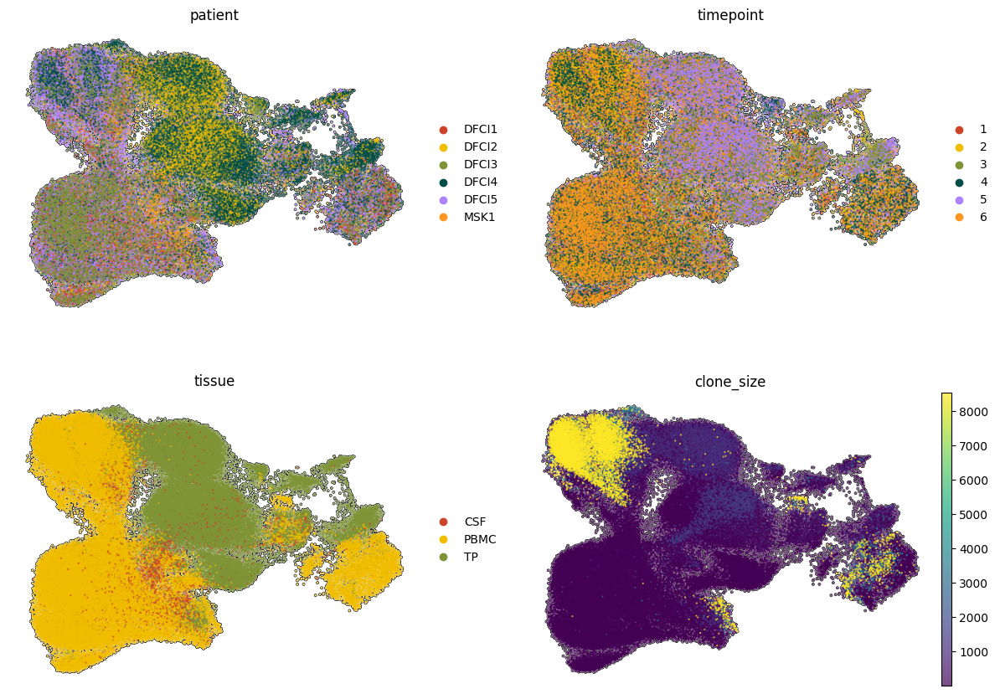

In [42]:
sc.pl.umap(adata,color=["patient","timepoint","tissue","clone_size"],ncols=2,frameon=False,add_outline=True,s=10)

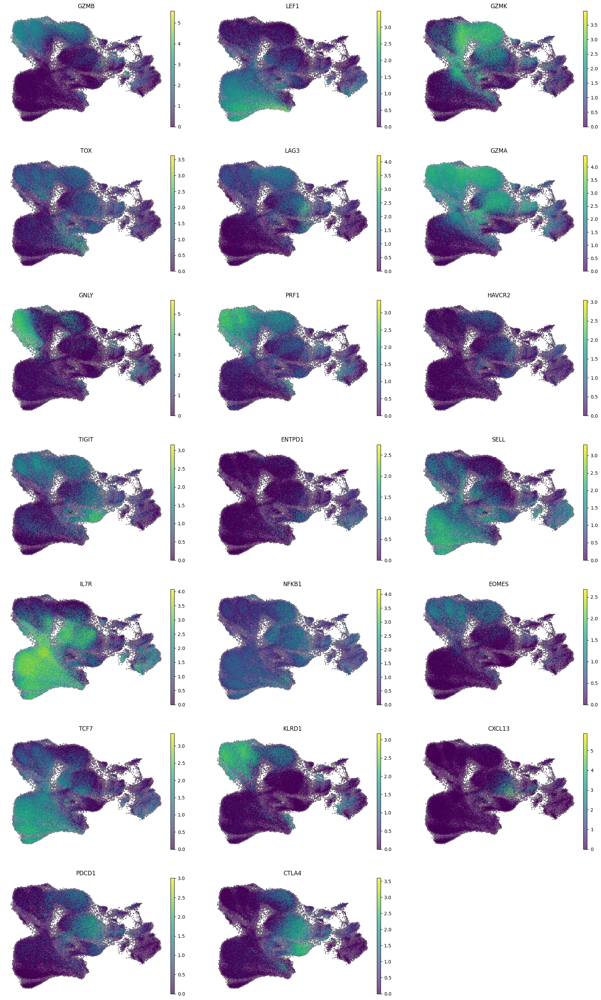

In [43]:
sc.pl.umap(adata,color=["GZMB","LEF1","GZMK","TOX","LAG3","GZMA","GNLY","PRF1","HAVCR2","TIGIT","ENTPD1","SELL","IL7R","NFKB1","EOMES","TCF7","KLRD1","CXCL13","PDCD1","CTLA4"],ncols=3,frameon=False,add_outline=True,s=5)

<Axes: xlabel='tissue', ylabel='count'>

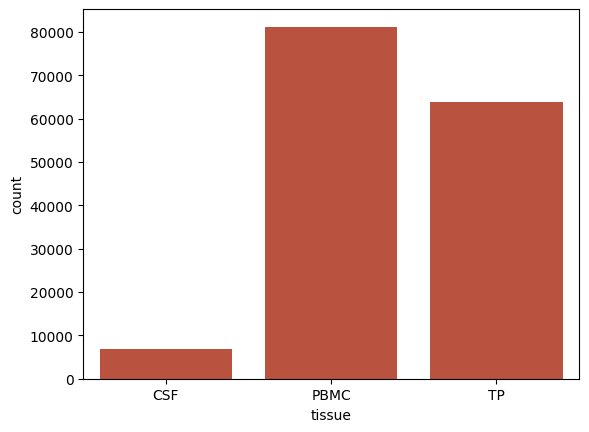

In [47]:
sns.countplot(data=adata.obs,x="tissue")

In [46]:

TABLE_TF = "/Users/ceglian/Downloads/41586_2025_9989_MOESM6_ESM.xlsx"
TABLE_SIG = "/Users/ceglian/Downloads/41586_2025_9989_MOESM10_ESM.xlsx"
adata_res=phenotype_tcells(adata, beltra_path=TABLE_SIG)

STEP 1: Hierarchical classifier
phenotype
CD4_Naive_Memory         55242
CD8_Activated_TEXeff     27218
CD4_Treg                 26719
CD8_Activated_TEXterm    12436
CD8_Activated_TRM         7864
CD4_Th1_polarized         7538
CD4_Exhausted             5650
CD8_Quiescent_Naive       5134
CD8_Quiescent_TEXprog     2224
CD8_Quiescent_Memory      1245
CD4_Th2_polarized          608
Name: count, dtype: int64

STEP 2: Post-hoc TEMRA gate (CX3CR1+ AND S1PR5/KLF2)
TEMRA cells gated: 17766
phenotype
CD4_Naive_Memory         55242
CD4_Treg                 26719
CD8_Activated_TEMRA      17766
CD8_Activated_TEXterm    12436
CD8_Activated_TEXeff      9452
CD8_Activated_TRM         7864
CD4_Th1_polarized         7538
CD4_Exhausted             5650
CD8_Quiescent_Naive       5134
CD8_Quiescent_TEXprog     2224
CD8_Quiescent_Memory      1245
CD4_Th2_polarized          608
Name: count, dtype: int64

STEP 3: TCR lineage switching correction
Cells to reclassify: 5382
Direction: {'CD8': 4066, 'CD4': 1316

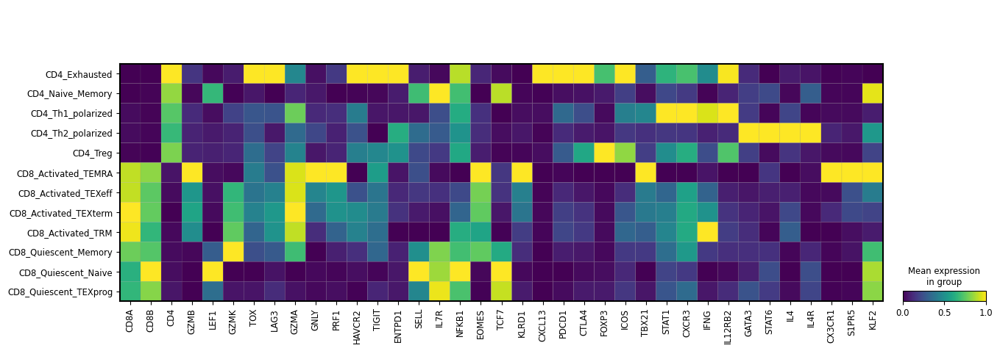

In [51]:
sc.pl.matrixplot(adata,["CD8A","CD8B","CD4","GZMB","LEF1","GZMK","TOX","LAG3","GZMA","GNLY","PRF1","HAVCR2","TIGIT","ENTPD1","SELL","IL7R","NFKB1","EOMES","TCF7","KLRD1","CXCL13","PDCD1","CTLA4","FOXP3","ICOS","TBX21","STAT1","CXCR3","IFNG","IL12RB2","GATA3","STAT6","IL4","IL4R","CX3CR1","S1PR5","KLF2"],groupby="phenotype",standard_scale="var")


In [52]:
from scipy import sparse
import pandas as pd
import numpy as np

genes = [
    "CD8A","CD8B","CD4","GZMB","LEF1","GZMK","TOX","LAG3","GZMA","GNLY",
    "PRF1","HAVCR2","TIGIT","ENTPD1","SELL","IL7R","NFKB1","EOMES","TCF7",
    "KLRD1","CXCL13","PDCD1","CTLA4","FOXP3","ICOS","TBX21","STAT1","CXCR3",
    "IFNG","IL12RB2","GATA3","STAT6","IL4","IL4R","CX3CR1","S1PR5","KLF2",
    # Additional: activation, exhaustion, residency, cycling, trafficking
    "CD69","NKG7","CST7","FGFBP2","FCGR3A","KLRF1","TYROBP",  # effector/NK-like
    "CXCR6","ITGAE","ZNF683","HOBIT",  # tissue residency
    "MKI67","TOP2A",  # proliferation
    "CCR7","S1PR1",  # naive/circulation
    "IL2RA","IKZF2","TNFRSF1B",  # Treg
    "NKG7","GZMH","FCER1G",  # cytotoxicity
    "ISG15","IFIT1",  # IFN-stimulated
    "MAL","BACH2",  # naive
]
genes = list(dict.fromkeys([g for g in genes if g in adata.var_names]))

# Extract expression matrix
if sparse.issparse(adata.X):
    expr = pd.DataFrame(adata[:, genes].X.toarray(), columns=genes, index=adata.obs.index)
else:
    expr = pd.DataFrame(adata[:, genes].X, columns=genes, index=adata.obs.index)

expr["phenotype"] = adata.obs["phenotype"].astype(str)
expr["tissue"] = adata.obs["tissue"].astype(str)
expr["timepoint"] = adata.obs["timepoint"].astype(str)
if "patient" in adata.obs.columns:
    expr["patient"] = adata.obs["patient"].astype(str)
elif "sample" in adata.obs.columns:
    expr["patient"] = adata.obs["sample"].astype(str)

# === 1. Mean expression by phenotype ===
print("=" * 80)
print("MEAN EXPRESSION BY PHENOTYPE")
print("=" * 80)
pheno_mean = expr.groupby("phenotype")[genes].mean()
print(pheno_mean.round(2).to_string())

# === 2. Mean expression by phenotype × tissue ===
print("\n" + "=" * 80)
print("MEAN EXPRESSION BY PHENOTYPE × TISSUE")
print("=" * 80)
pt_mean = expr.groupby(["phenotype", "tissue"])[genes].mean()
print(pt_mean.round(2).to_string())

# === 3. Mean expression by phenotype × timepoint ===
print("\n" + "=" * 80)
print("MEAN EXPRESSION BY PHENOTYPE × TIMEPOINT")
print("=" * 80)
ptp_mean = expr.groupby(["phenotype", "timepoint"])[genes].mean()
print(ptp_mean.round(2).to_string())

# === 4. Per-patient phenotype means (check consistency) ===
if "patient" in expr.columns:
    print("\n" + "=" * 80)
    print("PHENOTYPE EXPRESSION VARIANCE ACROSS PATIENTS (CV = std/mean)")
    print("=" * 80)
    pat_means = expr.groupby(["phenotype", "patient"])[genes].mean()
    pat_cv = pat_means.groupby("phenotype").agg(lambda x: x.std() / x.mean() if x.mean() > 0.01 else np.nan)
    print(pat_cv.round(2).to_string())

# === 5. FOXP3 deep dive in CD4_Exhausted ===
print("\n" + "=" * 80)
print("FOXP3 IN CD4_EXHAUSTED vs CD4_TREG")
print("=" * 80)
for pheno in ["CD4_Exhausted", "CD4_Treg"]:
    sub = expr[expr["phenotype"] == pheno]
    foxp3 = sub["FOXP3"]
    print(f"\n{pheno} (n={len(sub)}):")
    print(f"  mean={foxp3.mean():.3f}, median={foxp3.median():.3f}, "
          f"% positive (>0): {(foxp3 > 0).mean():.1%}, "
          f"% high (>0.5): {(foxp3 > 0.5).mean():.1%}")
    print(f"  By tissue:")
    for tissue in ["PBMC", "CSF", "TP"]:
        ts = sub[sub["tissue"] == tissue]["FOXP3"]
        if len(ts) > 0:
            print(f"    {tissue} (n={len(ts)}): mean={ts.mean():.3f}, "
                  f"% positive={( ts > 0).mean():.1%}")

    # Also check CTLA4, TIGIT, IL2RA overlap
    print(f"  Co-expression with Treg markers:")
    for g in ["CTLA4", "TIGIT", "IL2RA", "IKZF2", "ICOS"]:
        if g in genes:
            print(f"    {g}: mean={sub[g].mean():.3f}, %pos={(sub[g] > 0).mean():.1%}")

# === 6. Cell counts per grouping ===
print("\n" + "=" * 80)
print("CELL COUNTS: PHENOTYPE × TISSUE × TIMEPOINT")
print("=" * 80)
counts = pd.crosstab([expr["phenotype"], expr["tissue"]], expr["timepoint"], margins=True)
print(counts.to_string())

MEAN EXPRESSION BY PHENOTYPE
                       CD8A  CD8B   CD4  GZMB  LEF1  GZMK   TOX  LAG3  GZMA  GNLY  PRF1  HAVCR2  TIGIT  ENTPD1  SELL  IL7R  NFKB1  EOMES  TCF7  KLRD1  CXCL13  PDCD1  CTLA4  FOXP3  ICOS  TBX21  STAT1  CXCR3  IFNG  IL12RB2  GATA3  STAT6   IL4  IL4R  CX3CR1  S1PR5  KLF2  CD69  NKG7  CST7  FGFBP2  FCGR3A  KLRF1  TYROBP  CXCR6  ITGAE  ZNF683  MKI67  TOP2A  CCR7  S1PR1  IL2RA  IKZF2  TNFRSF1B  GZMH  FCER1G  ISG15  IFIT1   MAL  BACH2
phenotype                                                                                                                                                                                                                                                                                                                                                                                                                                     
CD4_Exhausted          0.03  0.01  0.60  0.25  0.07  0.37  0.90  1.13  1.00  0.10  0.34    0.29   0.97    0.1

In [53]:
import numpy as np
import pandas as pd
import matplotlib.pyplot as plt
import matplotlib.gridspec as gridspec
from matplotlib.colors import TwoSlopeNorm
from scipy import sparse
import warnings
warnings.filterwarnings('ignore')

# ============================================================
# DATA EXTRACTION
# ============================================================

def extract_expression(adata, genes, key="phenotype"):
    genes = [g for g in genes if g in adata.var_names]
    X = adata[:, genes].X
    if sparse.issparse(X):
        X = X.toarray()
    expr = pd.DataFrame(X, columns=genes, index=adata.obs.index)
    expr["phenotype"] = adata.obs[key].astype(str).values
    expr["tissue"] = adata.obs["tissue"].astype(str).values
    expr["timepoint"] = adata.obs["timepoint"].astype(str).values
    if "patient" in adata.obs.columns:
        expr["patient"] = adata.obs["patient"].astype(str).values
    return expr, genes


# ============================================================
# PLOT 1: PHENOTYPE × MARKER HEATMAP (z-scored)
# ============================================================

def plot_phenotype_heatmap(adata, genes=None, key="phenotype", figsize=(18, 6)):
    if genes is None:
        genes = [
            "CD8A","CD8B","CD4",
            "NKG7","GZMB","PRF1","GNLY","GZMA","CST7",
            "CX3CR1","S1PR5","KLF2","FGFBP2","FCGR3A",
            "GZMK","EOMES",
            "CD69","ZNF683","ITGAE",
            "TOX","LAG3","PDCD1","HAVCR2","TIGIT","ENTPD1","CXCL13",
            "TCF7","LEF1","CCR7","SELL","MAL","BACH2",
            "IL7R",
            "FOXP3","IL2RA","IKZF2","ICOS","CTLA4",
            "TBX21","STAT1","CXCR3","IFNG",
            "GATA3","STAT6","IL4R",
        ]
    expr, genes = extract_expression(adata, genes, key)

    pheno_order = [
        "CD8_Activated_TEMRA","CD8_Activated_TEXeff","CD8_Activated_TEXterm",
        "CD8_Activated_TRM","CD8_Quiescent_Memory","CD8_Quiescent_Naive",
        "CD8_Quiescent_TEXprog",
        "CD4_Naive_Memory","CD4_Exhausted","CD4_Treg",
        "CD4_Th1_polarized","CD4_Th2_polarized",
    ]
    pheno_order = [p for p in pheno_order if p in expr["phenotype"].unique()]

    means = expr.groupby("phenotype")[genes].mean().loc[pheno_order]
    zscored = (means - means.mean()) / means.std()

    fig, ax = plt.subplots(figsize=figsize)
    norm = TwoSlopeNorm(vmin=-2, vcenter=0, vmax=3)
    im = ax.imshow(zscored.values, aspect="auto", cmap="RdBu_r", norm=norm)

    ax.set_xticks(range(len(genes)))
    ax.set_xticklabels(genes, rotation=60, ha="right", fontsize=8)
    ax.set_yticks(range(len(pheno_order)))
    short = [p.replace("CD8_Activated_","CD8a_").replace("CD8_Quiescent_","CD8q_").replace("CD4_","CD4_") for p in pheno_order]
    ax.set_yticklabels(short, fontsize=9)

    # Add cell counts
    counts = expr["phenotype"].value_counts()
    for i, p in enumerate(pheno_order):
        ax.text(len(genes) + 0.3, i, f"n={counts[p]:,}", va="center", fontsize=7, color="gray")

    plt.colorbar(im, ax=ax, label="z-score", shrink=0.8, pad=0.12)
    ax.set_title("Phenotype marker expression (z-scored across phenotypes)", fontsize=11, pad=10)
    plt.tight_layout()
    return fig


# ============================================================
# PLOT 2: TISSUE STABILITY — same markers, split by tissue
# ============================================================

def plot_tissue_stability(adata, genes=None, key="phenotype", figsize=(20, 14)):
    if genes is None:
        genes = [
            "CD8A","CX3CR1","S1PR5","KLF2","GZMB","NKG7","GZMK",
            "CD69","ZNF683","TOX","LAG3","PDCD1","CXCL13",
            "TCF7","LEF1","SELL","IL7R",
            "FOXP3","IKZF2","IL2RA","ICOS","CTLA4",
            "TBX21","IFNG","GATA3",
        ]
    expr, genes = extract_expression(adata, genes, key)

    pheno_order = [
        "CD8_Activated_TEMRA","CD8_Activated_TEXeff","CD8_Activated_TEXterm",
        "CD8_Activated_TRM","CD8_Quiescent_Naive","CD8_Quiescent_TEXprog",
        "CD4_Naive_Memory","CD4_Exhausted","CD4_Treg",
        "CD4_Th1_polarized",
    ]
    pheno_order = [p for p in pheno_order if p in expr["phenotype"].unique()]
    tissues = ["PBMC", "CSF", "TP"]

    fig, axes = plt.subplots(1, 3, figsize=figsize, sharey=True)
    norm = TwoSlopeNorm(vmin=-2, vcenter=0, vmax=3)

    # Compute global z-score params from overall means
    overall = expr.groupby("phenotype")[genes].mean().loc[pheno_order]
    mu, sd = overall.mean(), overall.std()

    for j, tissue in enumerate(tissues):
        sub = expr[expr["tissue"] == tissue]
        tissue_means = sub.groupby("phenotype")[genes].mean()

        # Fill missing phenotypes with NaN
        mat = pd.DataFrame(index=pheno_order, columns=genes, dtype=float)
        for p in pheno_order:
            if p in tissue_means.index:
                mat.loc[p] = tissue_means.loc[p]

        zscored = (mat - mu) / sd

        ax = axes[j]
        data = zscored.values.astype(float)
        masked = np.ma.masked_invalid(data)
        ax.imshow(masked, aspect="auto", cmap="RdBu_r", norm=norm)

        # Gray out cells with <10 observations
        tissue_counts = sub["phenotype"].value_counts()
        for i, p in enumerate(pheno_order):
            n = tissue_counts.get(p, 0)
            if n < 10:
                for k in range(len(genes)):
                    ax.add_patch(plt.Rectangle((k-0.5, i-0.5), 1, 1,
                                 fill=True, facecolor="lightgray", edgecolor="none"))
            ax.text(len(genes) + 0.2, i, f"{n:,}", va="center", fontsize=6, color="gray")

        ax.set_xticks(range(len(genes)))
        ax.set_xticklabels(genes, rotation=60, ha="right", fontsize=7)
        ax.set_title(f"{tissue}", fontsize=12, fontweight="bold")

        if j == 0:
            ax.set_yticks(range(len(pheno_order)))
            short = [p.split("_",1)[1] for p in pheno_order]
            ax.set_yticklabels(short, fontsize=8)

    fig.suptitle("Phenotype stability across tissues (z-scored, global reference)", fontsize=13, y=1.01)
    plt.tight_layout()
    return fig


# ============================================================
# PLOT 3: TIMEPOINT STABILITY — line plots for key markers
# ============================================================

def plot_timepoint_stability(adata, key="phenotype", figsize=(16, 12)):
    marker_sets = {
        "TEMRA identity": ("CD8_Activated_TEMRA", ["CX3CR1", "S1PR5", "KLF2", "FGFBP2"]),
        "Exhaustion axis": ("CD8_Activated_TEXterm", ["TOX", "LAG3", "PDCD1", "HAVCR2"]),
        "TRM residency": ("CD8_Activated_TRM", ["CD69", "ZNF683", "ITGAE", "IFNG"]),
        "Naive identity": ("CD8_Quiescent_Naive", ["TCF7", "LEF1", "CCR7", "SELL"]),
        "Treg identity": ("CD4_Treg", ["FOXP3", "IKZF2", "IL2RA", "ICOS"]),
        "CD4 exhaustion": ("CD4_Exhausted", ["CXCL13", "PDCD1", "TOX", "CTLA4"]),
    }

    all_genes = list(set(g for _, (_, gs) in marker_sets.items() for g in gs))
    expr, valid_genes = extract_expression(adata, all_genes, key)
    timepoints = sorted(expr["timepoint"].unique())

    fig, axes = plt.subplots(2, 3, figsize=figsize, sharex=True)
    colors = plt.cm.Set2(np.linspace(0, 1, 8))

    for idx, (title, (pheno, markers)) in enumerate(marker_sets.items()):
        ax = axes.flat[idx]
        sub = expr[expr["phenotype"] == pheno]

        for i, g in enumerate(markers):
            if g not in valid_genes:
                continue
            means = sub.groupby("timepoint")[g].mean()
            sems = sub.groupby("timepoint")[g].sem()
            x = [timepoints.index(t) for t in means.index]
            ax.plot(x, means.values, "o-", color=colors[i], label=g, linewidth=2, markersize=5)
            ax.fill_between(x, means.values - sems.values, means.values + sems.values,
                          alpha=0.15, color=colors[i])

        ax.set_title(f"{title}\n({pheno.split('_',1)[1]})", fontsize=9)
        ax.set_xticks(range(len(timepoints)))
        ax.set_xticklabels([f"T{t}" for t in timepoints], fontsize=8)
        ax.legend(fontsize=7, loc="best", framealpha=0.8)
        ax.set_ylabel("Mean expression", fontsize=8)
        ax.grid(alpha=0.2)

    fig.suptitle("Marker expression stability across timepoints (mean ± SEM)", fontsize=13, y=1.01)
    plt.tight_layout()
    return fig


# ============================================================
# PLOT 4: PATIENT CV HEATMAP
# ============================================================

def plot_patient_cv(adata, genes=None, key="phenotype", figsize=(16, 6)):
    if genes is None:
        genes = [
            "CD8A","CD4","CX3CR1","S1PR5","KLF2","GZMB","NKG7","GZMK",
            "CD69","ZNF683","TOX","LAG3","PDCD1","CXCL13",
            "TCF7","LEF1","IL7R",
            "FOXP3","IKZF2","CTLA4","TBX21","IFNG","GATA3",
        ]
    expr, genes = extract_expression(adata, genes, key)
    if "patient" not in expr.columns:
        print("No patient column found")
        return None

    pheno_order = [
        "CD8_Activated_TEMRA","CD8_Activated_TEXeff","CD8_Activated_TEXterm",
        "CD8_Activated_TRM","CD8_Quiescent_Naive","CD8_Quiescent_TEXprog",
        "CD4_Naive_Memory","CD4_Exhausted","CD4_Treg","CD4_Th1_polarized",
    ]
    pheno_order = [p for p in pheno_order if p in expr["phenotype"].unique()]

    pat_means = expr.groupby(["phenotype", "patient"])[genes].mean()
    cv = pat_means.groupby("phenotype").agg(lambda x: x.std() / x.mean() if x.mean() > 0.05 else np.nan)
    cv = cv.loc[[p for p in pheno_order if p in cv.index]]

    fig, ax = plt.subplots(figsize=figsize)
    data = cv.values.astype(float)
    masked = np.ma.masked_invalid(data)
    im = ax.imshow(masked, aspect="auto", cmap="YlOrRd", vmin=0, vmax=1.0)

    # Annotate values
    for i in range(data.shape[0]):
        for j in range(data.shape[1]):
            val = data[i, j]
            if not np.isnan(val):
                color = "white" if val > 0.6 else "black"
                ax.text(j, i, f"{val:.1f}", ha="center", va="center", fontsize=6, color=color)

    ax.set_xticks(range(len(genes)))
    ax.set_xticklabels(genes, rotation=60, ha="right", fontsize=8)
    ax.set_yticks(range(len(cv.index)))
    short = [p.split("_",1)[1] for p in cv.index]
    ax.set_yticklabels(short, fontsize=8)
    plt.colorbar(im, ax=ax, label="CV (std/mean)", shrink=0.8)
    ax.set_title("Cross-patient consistency (CV < 0.3 = highly stable)", fontsize=11, pad=10)
    plt.tight_layout()
    return fig


# ============================================================
# PLOT 5: FOXP3 / TREG vs EXHAUSTED DEEP DIVE
# ============================================================

def plot_foxp3_deepdive(adata, key="phenotype", figsize=(14, 5)):
    genes_compare = ["FOXP3","CXCL13","PDCD1","TOX","IKZF2","IL2RA","CTLA4","ICOS"]
    expr, genes_compare = extract_expression(adata, genes_compare, key)

    phenos = ["CD4_Exhausted", "CD4_Treg"]
    sub = expr[expr["phenotype"].isin(phenos)]

    fig, axes = plt.subplots(1, len(genes_compare), figsize=figsize, sharey=False)
    colors = {"CD4_Exhausted": "#d62728", "CD4_Treg": "#2ca02c"}

    for i, g in enumerate(genes_compare):
        ax = axes[i]
        positions = []
        for j, p in enumerate(phenos):
            data = sub[sub["phenotype"] == p][g].values
            parts = ax.violinplot([data], positions=[j], showmeans=True, showmedians=False, widths=0.7)
            for pc in parts["bodies"]:
                pc.set_facecolor(colors[p])
                pc.set_alpha(0.6)
            parts["cmeans"].set_color("black")
            parts["cmins"].set_color("gray")
            parts["cmaxes"].set_color("gray")
            parts["cbars"].set_color("gray")

            pct_pos = (data > 0).mean() * 100
            ax.text(j, ax.get_ylim()[1] * 0.05 if i == 0 else data.max() * 1.05,
                   f"{pct_pos:.0f}%+", ha="center", fontsize=6, color="gray")

        ax.set_xticks([0, 1])
        ax.set_xticklabels(["Exh", "Treg"], fontsize=7)
        ax.set_title(g, fontsize=9)
        if i == 0:
            ax.set_ylabel("Expression", fontsize=8)
        ax.grid(alpha=0.15, axis="y")

    fig.suptitle("CD4_Exhausted vs CD4_Treg: discriminating markers", fontsize=11, y=1.02)
    plt.tight_layout()
    return fig


# ============================================================
# PLOT 6: COMPOSITE DOTPLOT (fraction expressing × mean expression)
# ============================================================

def plot_dotplot(adata, genes=None, key="phenotype", figsize=(18, 7)):
    if genes is None:
        genes = [
            "CD8A","CD8B","CD4",
            "CX3CR1","S1PR5","KLF2",
            "NKG7","GZMB","PRF1","GZMK",
            "CD69","ZNF683",
            "TOX","LAG3","PDCD1","HAVCR2","CXCL13",
            "TCF7","LEF1","CCR7","SELL","IL7R",
            "FOXP3","IKZF2","IL2RA",
            "TBX21","IFNG","GATA3",
        ]
    expr, genes = extract_expression(adata, genes, key)

    pheno_order = [
        "CD8_Activated_TEMRA","CD8_Activated_TEXeff","CD8_Activated_TEXterm",
        "CD8_Activated_TRM","CD8_Quiescent_Memory","CD8_Quiescent_Naive",
        "CD8_Quiescent_TEXprog",
        "CD4_Naive_Memory","CD4_Exhausted","CD4_Treg",
        "CD4_Th1_polarized","CD4_Th2_polarized",
    ]
    pheno_order = [p for p in pheno_order if p in expr["phenotype"].unique()]

    frac_pos = expr.groupby("phenotype")[genes].apply(lambda x: (x > 0).mean()).loc[pheno_order]
    mean_expr = expr.groupby("phenotype")[genes].mean().loc[pheno_order]

    fig, ax = plt.subplots(figsize=figsize)

    for i, pheno in enumerate(pheno_order):
        for j, gene in enumerate(genes):
            frac = frac_pos.loc[pheno, gene]
            mean_val = mean_expr.loc[pheno, gene]
            size = frac * 200
            if size > 1:
                ax.scatter(j, i, s=size, c=mean_val, cmap="Reds", vmin=0, vmax=2.5,
                          edgecolors="gray", linewidths=0.3)

    ax.set_xticks(range(len(genes)))
    ax.set_xticklabels(genes, rotation=60, ha="right", fontsize=8)
    ax.set_yticks(range(len(pheno_order)))
    short = [p.replace("CD8_Activated_","CD8a_").replace("CD8_Quiescent_","CD8q_").replace("CD4_","CD4_") for p in pheno_order]
    ax.set_yticklabels(short, fontsize=9)

    # Add horizontal line separating CD8/CD4
    cd4_start = next(i for i, p in enumerate(pheno_order) if "CD4" in p)
    ax.axhline(cd4_start - 0.5, color="black", linewidth=0.8, linestyle="--")

    # Legend for dot size
    for frac_val in [0.25, 0.5, 0.75, 1.0]:
        ax.scatter([], [], s=frac_val * 200, c="gray", alpha=0.5, label=f"{frac_val:.0%}")
    leg = ax.legend(title="% expressing", loc="upper right", fontsize=7, title_fontsize=8,
                   bbox_to_anchor=(1.12, 1))

    sm = plt.cm.ScalarMappable(cmap="Reds", norm=plt.Normalize(0, 2.5))
    plt.colorbar(sm, ax=ax, label="Mean expression", shrink=0.6, pad=0.15)

    ax.set_title("Dotplot: fraction expressing × mean expression", fontsize=11, pad=10)
    ax.set_xlim(-0.5, len(genes) - 0.5)
    ax.set_ylim(-0.5, len(pheno_order) - 0.5)
    ax.invert_yaxis()
    plt.tight_layout()
    return fig


# ============================================================
# RUN ALL
# ============================================================

def run_validation_plots(adata, key="phenotype", save_prefix="phenotype_validation"):
    figs = {}

    print("Plot 1: Phenotype heatmap...")
    figs["heatmap"] = plot_phenotype_heatmap(adata, key=key)
    figs["heatmap"].savefig(f"{save_prefix}_heatmap.png", dpi=200, bbox_inches="tight")

    print("Plot 2: Tissue stability...")
    figs["tissue"] = plot_tissue_stability(adata, key=key)
    figs["tissue"].savefig(f"{save_prefix}_tissue.png", dpi=200, bbox_inches="tight")

    print("Plot 3: Timepoint stability...")
    figs["timepoint"] = plot_timepoint_stability(adata, key=key)
    figs["timepoint"].savefig(f"{save_prefix}_timepoint.png", dpi=200, bbox_inches="tight")

    print("Plot 4: Patient CV...")
    figs["cv"] = plot_patient_cv(adata, key=key)
    if figs["cv"]:
        figs["cv"].savefig(f"{save_prefix}_patient_cv.png", dpi=200, bbox_inches="tight")

    print("Plot 5: FOXP3 deep dive...")
    figs["foxp3"] = plot_foxp3_deepdive(adata, key=key)
    figs["foxp3"].savefig(f"{save_prefix}_foxp3.png", dpi=200, bbox_inches="tight")

    print("Plot 6: Dotplot...")
    figs["dotplot"] = plot_dotplot(adata, key=key)
    figs["dotplot"].savefig(f"{save_prefix}_dotplot.png", dpi=200, bbox_inches="tight")

    print(f"Done. {len(figs)} figures saved.")
    plt.close("all")
    return figs


run_validation_plots(adata)

Plot 1: Phenotype heatmap...
Plot 2: Tissue stability...
Plot 3: Timepoint stability...
Plot 4: Patient CV...
Plot 5: FOXP3 deep dive...
Plot 6: Dotplot...
Done. 6 figures saved.


{'heatmap': <Figure size 1800x600 with 2 Axes>,
 'tissue': <Figure size 2000x1400 with 3 Axes>,
 'timepoint': <Figure size 1600x1200 with 6 Axes>,
 'cv': <Figure size 1600x600 with 2 Axes>,
 'foxp3': <Figure size 1400x500 with 8 Axes>,
 'dotplot': <Figure size 1800x700 with 2 Axes>}

In [55]:
!cp phenotype_validation*png /Users/ceglian/

In [48]:
print(pd.crosstab(adata.obs["tissue"], adata.obs["timepoint"]))
print()
print(pd.crosstab(adata.obs["phenotype"], adata.obs["tissue"]))
print()
# Treg by tissue × timepoint
treg = adata.obs[adata.obs["phenotype"] == "CD4_Treg"]
print("Treg by tissue × timepoint:")
print(pd.crosstab(treg["tissue"], treg["timepoint"]))

timepoint      1      2      3      4      5      6
tissue                                             
CSF          277   2048   2961   1397    142      0
PBMC       16612  14798  14493  16729  12172   6388
TP          3857   2188  11577  10155  20233  15851

tissue                  CSF   PBMC     TP
phenotype                                
CD4_Exhausted           324    159   5055
CD4_Naive_Memory       2379  45306   7398
CD4_Th1_polarized       270    514   6152
CD4_Th2_polarized        34    253    227
CD4_Treg               2168   2923  19845
CD8_Activated_TEMRA      29  18621    378
CD8_Activated_TEXeff    679   3900   5428
CD8_Activated_TEXterm   526   2998   9203
CD8_Activated_TRM         2      3   8375
CD8_Quiescent_Memory    163    566    603
CD8_Quiescent_Naive     196   4343    570
CD8_Quiescent_TEXprog    55   1606    627

Treg by tissue × timepoint:
timepoint    1    2     3     4     5     6
tissue                                     
CSF         79  811   917   324   

([0, 1, 2, 3, 4, 5, 6, 7, 8, 9, 10, 11],
 [Text(0, 0, 'CD4_Exhausted'),
  Text(1, 0, 'CD4_Naive_Memory'),
  Text(2, 0, 'CD4_Th1_polarized'),
  Text(3, 0, 'CD4_Th2_polarized'),
  Text(4, 0, 'CD4_Treg'),
  Text(5, 0, 'CD8_Activated_TEMRA'),
  Text(6, 0, 'CD8_Activated_TEXeff'),
  Text(7, 0, 'CD8_Activated_TEXterm'),
  Text(8, 0, 'CD8_Activated_TRM'),
  Text(9, 0, 'CD8_Quiescent_Memory'),
  Text(10, 0, 'CD8_Quiescent_Naive'),
  Text(11, 0, 'CD8_Quiescent_TEXprog')])

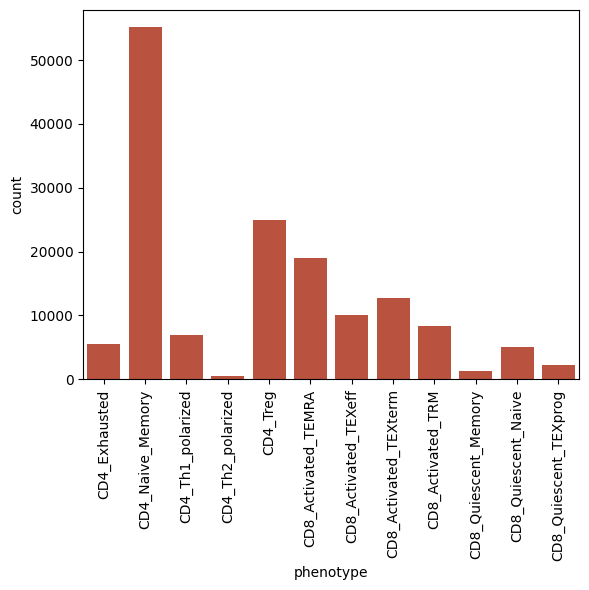

In [56]:
sns.countplot(data=adata.obs,x="phenotype")
plt.xticks(rotation=90)

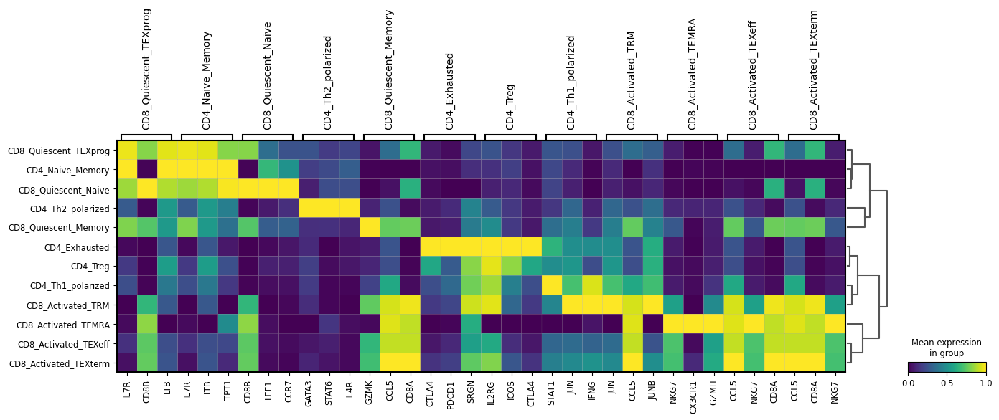

In [57]:
sc.tl.rank_genes_groups(adata, "phenotype")
sc.pl.rank_genes_groups_matrixplot(adata, standard_scale="var", n_genes=3)

In [61]:
markers = dict()
for x in adata.obs["phenotype"].unique():
    df = sc.get.rank_genes_groups_df(adata,x)
    markers[x] = df["names"].tolist()[:10]
    print(x, markers[x])

CD8_Activated_TRM ['JUN', 'CCL5', 'JUNB', 'CD8A', 'DUSP1', 'JUND', 'CD69', 'ZFP36', 'FOS', 'H3F3B']
CD4_Th1_polarized ['STAT1', 'JUN', 'IFNG', 'TNFAIP3', 'DUSP1', 'EEF1G', 'CXCR3', 'CD69', 'JUNB', 'EIF4A1']
CD4_Naive_Memory ['IL7R', 'LTB', 'TPT1', 'TCF7', 'MAL', 'LEF1', 'KLF2', 'NOSIP', 'NAP1L1', 'LDHB']
CD8_Activated_TEXterm ['CCL5', 'CD8A', 'NKG7', 'GZMA', 'CST7', 'CD8B', 'KLRK1', 'GZMH', 'GZMK', 'CTSW']
CD4_Treg ['IL2RG', 'ICOS', 'CTLA4', 'EEF1G', 'RGS1', 'ARID5B', 'SRGN', 'TNFAIP3', 'UBC', 'RNASEK']
CD8_Activated_TEXeff ['CCL5', 'NKG7', 'CD8A', 'GZMA', 'CST7', 'CD8B', 'CTSW', 'GZMK', 'GZMH', 'KLRK1']
CD8_Quiescent_TEXprog ['IL7R', 'CD8B', 'LTB', 'CD8A', 'TCF7', 'ARHGAP15', 'NOSIP', 'NELL2', 'KLF2', 'TPT1']
CD8_Quiescent_Memory ['GZMK', 'CCL5', 'CD8A', 'CD8B', 'IL7R', 'NELL2', 'GZMA', 'LYAR', 'KLRK1', 'ZFP36L2']
CD4_Exhausted ['CTLA4', 'PDCD1', 'SRGN', 'DUSP4', 'RGS1', 'GAPDH', 'DUSP2', 'LAG3', 'TOX', 'ICOS']
CD8_Quiescent_Naive ['CD8B', 'LEF1', 'CCR7', 'SELL', 'IL7R', 'NELL2', 'BAC

<Axes: xlabel='clone_size', ylabel='Count'>

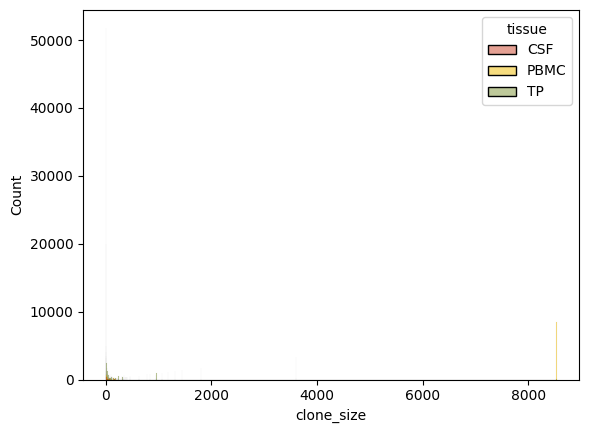

In [64]:
import stcr
import tcri
import seaborn as sns

stcr.pp.register_clonotype_key(adata,"trb")
stcr.pp.register_phenotype_key(adata,"phenotype")
stcr.pp.clone_size(adata)
sns.histplot(data=adata.obs, x="clone_size", hue="tissue")

In [65]:
clonality = stcr.tl.clonality(adata)
clonality

{np.str_('CD4_Exhausted'): np.float64(0.17418183269520948),
 np.str_('CD4_Naive_Memory'): np.float64(0.01506535652614327),
 np.str_('CD4_Th1_polarized'): np.float64(0.16878607325553485),
 np.str_('CD4_Th2_polarized'): np.float64(0.018777646061442943),
 np.str_('CD4_Treg'): np.float64(0.10112475540168386),
 np.str_('CD8_Activated_TEMRA'): np.float64(0.5323149357814214),
 np.str_('CD8_Activated_TEXeff'): np.float64(0.20816797784967533),
 np.str_('CD8_Activated_TEXterm'): np.float64(0.2255221952249269),
 np.str_('CD8_Activated_TRM'): np.float64(0.22126124005264558),
 np.str_('CD8_Quiescent_Memory'): np.float64(0.04275987999368036),
 np.str_('CD8_Quiescent_Naive'): np.float64(0.008440531359811265),
 np.str_('CD8_Quiescent_TEXprog'): np.float64(0.040923554326369405)}

In [76]:
# cd8 = adata[adata.obs["phenotype_level1"] == "CD8"].copy()
# stcr.pp.register_clonotype_key(cd8,"trb")
# stcr.pp.register_phenotype_key(cd8,"phenotype")
# stcr.pp.clone_size(cd8)

# cd4 = adata[adata.obs["phenotype_level1"] == "CD4"].copy()
# stcr.pp.register_clonotype_key(cd4,"trb")
# stcr.pp.register_phenotype_key(cd4,"phenotype")
# stcr.pp.clone_size(cd4)
cd4.uns["stcr_unique_phenotypes"] = [x for x in cd4.uns["stcr_unique_phenotypes"] if "CD4" in x]
cd8.uns["stcr_unique_phenotypes"] = [x for x in cd8.uns["stcr_unique_phenotypes"] if "CD8" in x]

In [ ]:
# Edge weight annotations on the top N edges so the numbers are visible on the plot
# Phenotype-stratified networks — separate networks for TEMRA-containing clones vs TEX-containing clones to see if they have different trafficking patterns
# Directional flow — compare which clones appear first in blood then tumor vs first in tumor then blood (using timepoint ordering as a proxy for directionality)
# Move to simplices with the corrected data

<Axes: title={'center': 'Clonality'}, xlabel='Phenotype', ylabel='Clonality'>

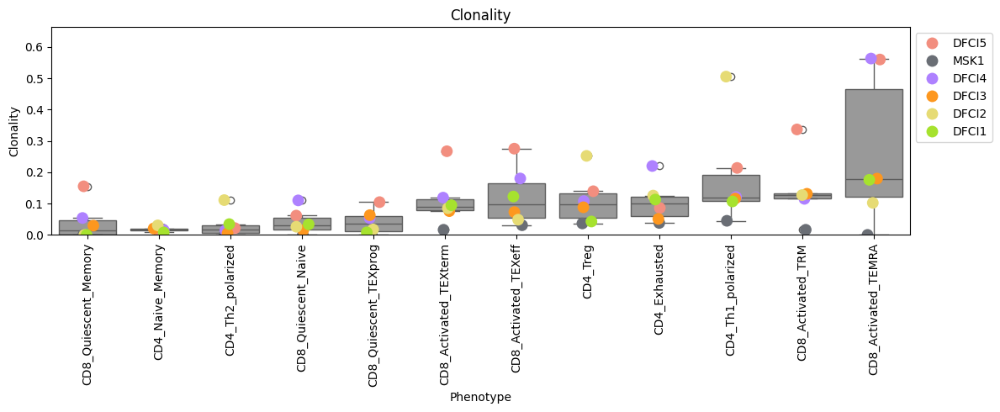

In [77]:
stcr.pl.clonality(cd4, groupby = "patient", s=10, figsize=(12,5), rotation=90)

<Axes: title={'center': 'Clonality'}, xlabel='Phenotype', ylabel='Clonality'>

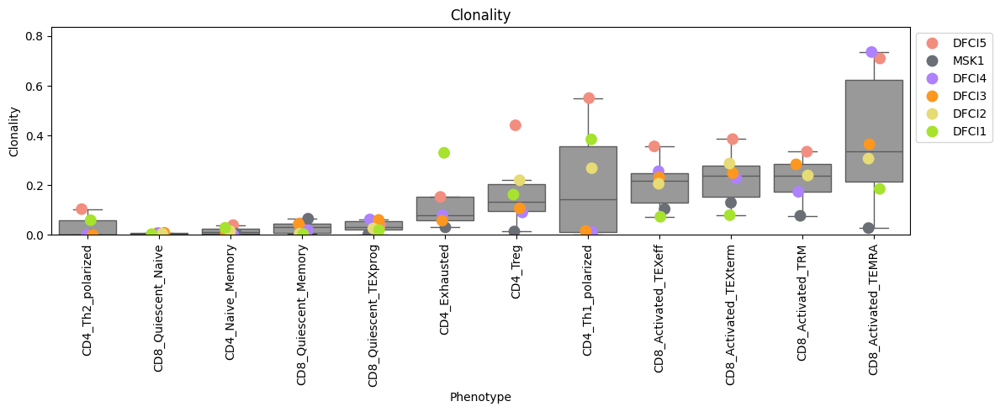

In [78]:
stcr.pl.clonality(cd8, groupby = "patient", s=10, figsize=(12,5), rotation=90)

Total records: 481, patients: 6
Phenotype×tissue combos: 34

Records per patient:
patient
DFCI1     22
DFCI2     74
DFCI3    129
DFCI4     90
DFCI5    117
MSK1      49
dtype: int64


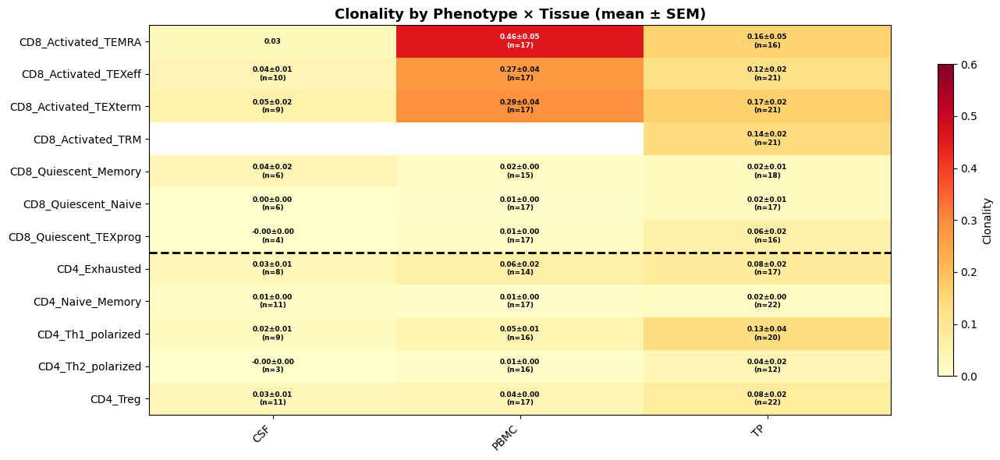

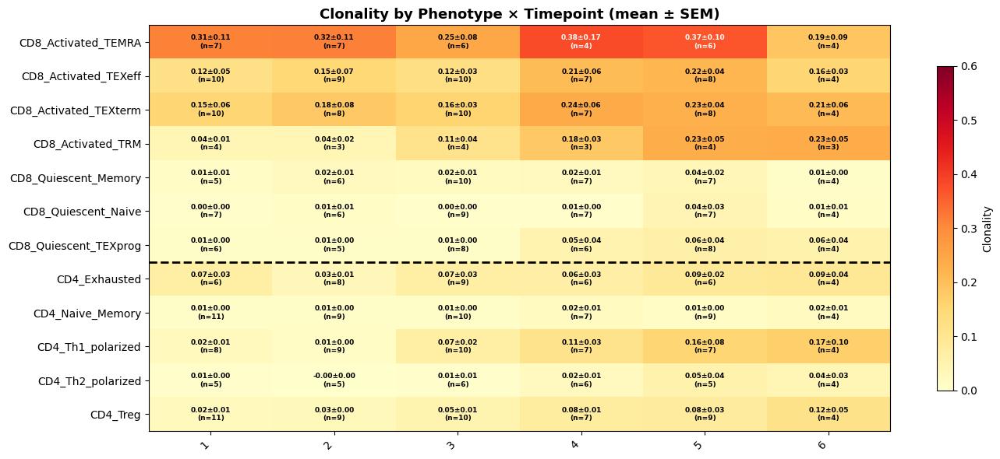

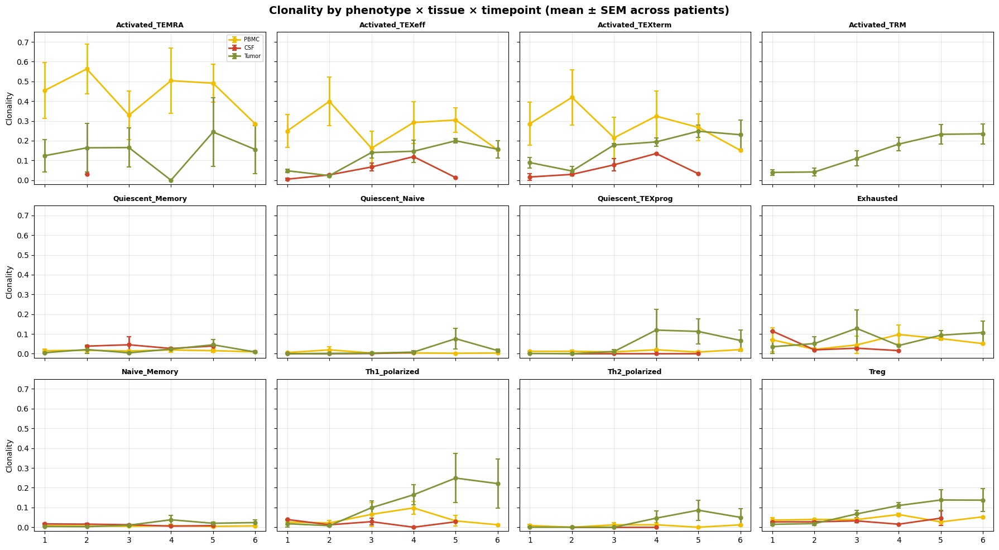

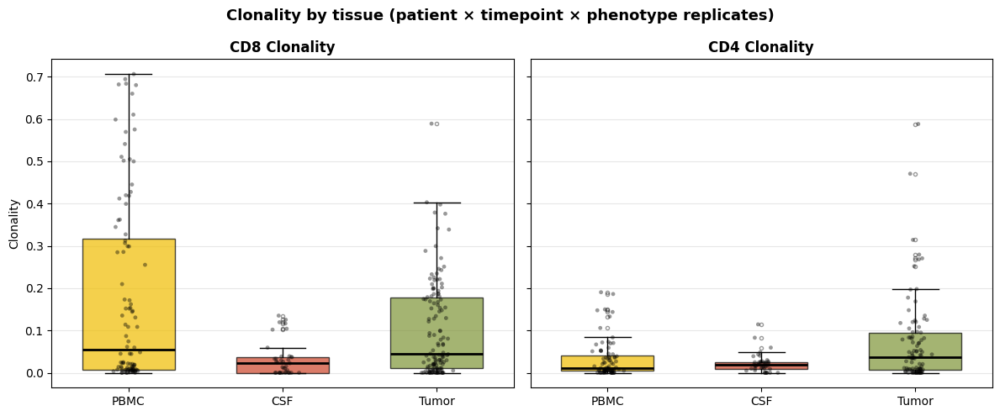

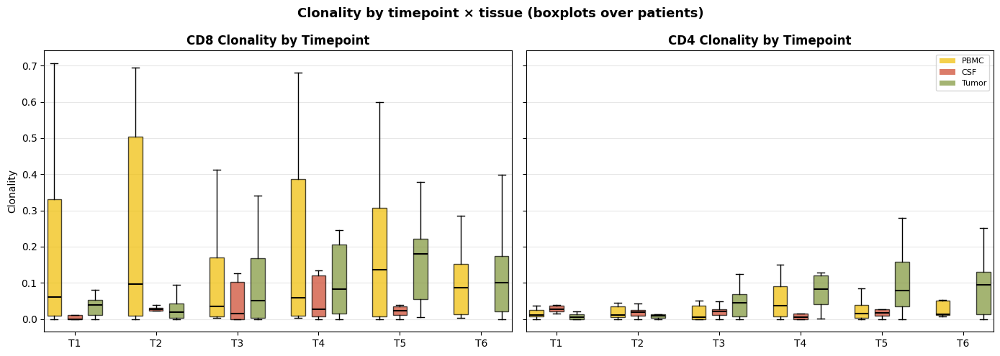


Correlation pairs tested: 414
Significant (Bonferroni p<0.05): 11

Top 20 positive correlations:
                   combo1                     combo2       rho     pval_adj  n_obs
     CD4_Th1_polarized_TP                CD4_Treg_TP  0.948477 8.339254e-08     20
  CD8_Activated_TEXeff_TP   CD8_Activated_TEXterm_TP  0.928571 5.300419e-07     21
 CD8_Activated_TEMRA_PBMC CD8_Activated_TEXterm_PBMC  0.906863 2.145709e-04     17
CD8_Activated_TEXeff_PBMC CD8_Activated_TEXterm_PBMC  0.894608 5.227644e-04     17
 CD8_Activated_TEMRA_PBMC  CD8_Activated_TEXeff_PBMC  0.892157 6.165915e-04     17
  CD8_Activated_TEXeff_TP       CD8_Activated_TRM_TP  0.840260 7.761944e-04     21
   CD8_Quiescent_Naive_TP   CD8_Quiescent_TEXprog_TP  0.834674 4.493251e-02     15
 CD8_Activated_TEXterm_TP       CD8_Activated_TRM_TP  0.833766 1.103395e-03     21
     CD4_Th1_polarized_TP   CD8_Activated_TEXterm_TP  0.779240 2.127381e-02     20
              CD4_Treg_TP   CD8_Activated_TEXterm_TP  0.759740 2.674921e

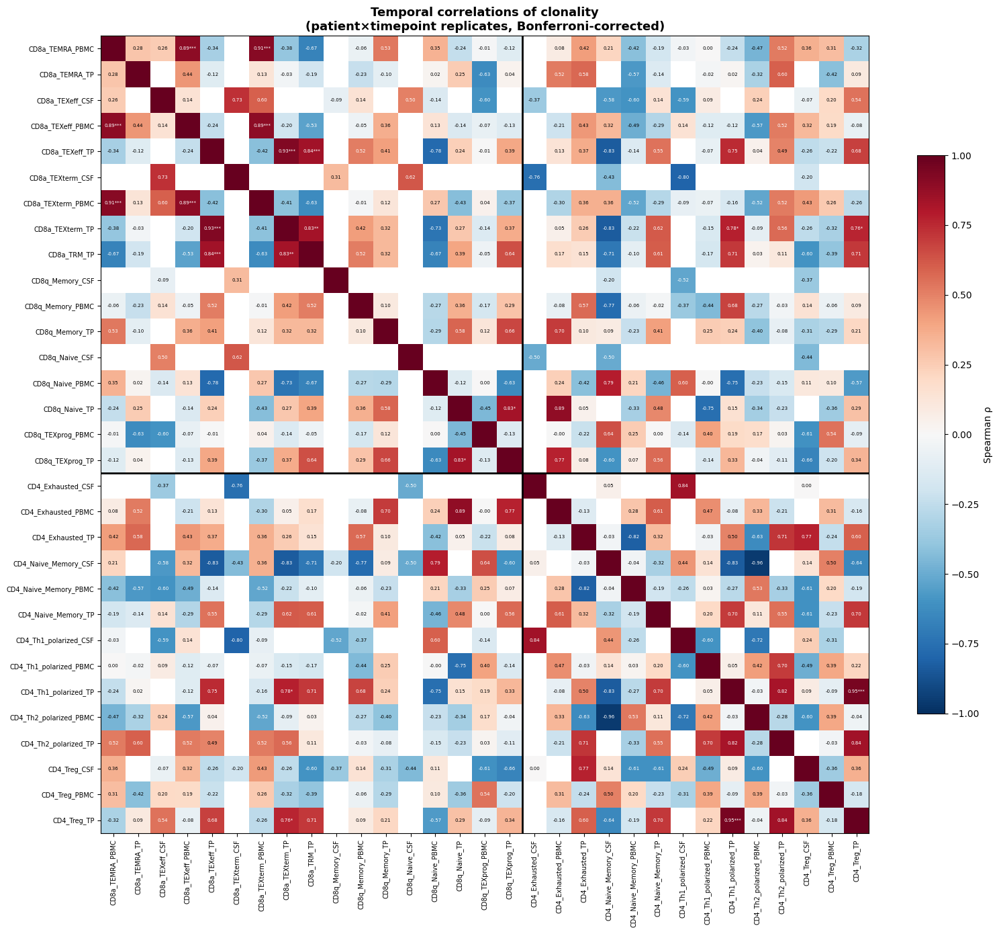

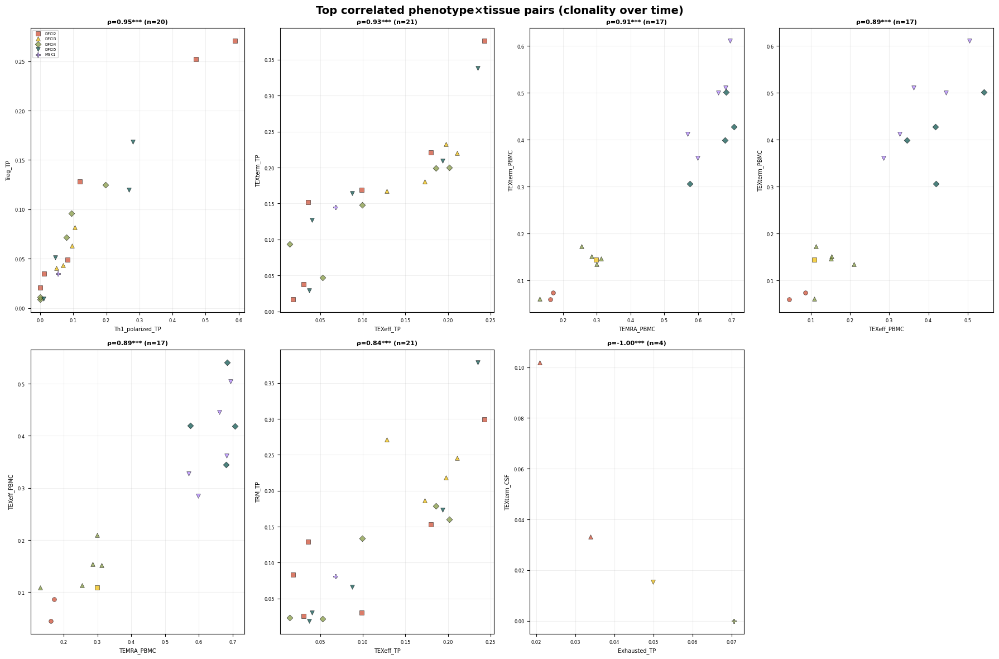

In [90]:
import logging
logging.getLogger('matplotlib').setLevel(logging.WARNING)

import stcr
import pandas as pd
import numpy as np
import matplotlib.pyplot as plt
from matplotlib.colors import Normalize
from scipy import stats
from itertools import combinations

TISSUE_COLORS = {'CSF': '#cd442a', 'PBMC': '#f0bd00', 'TP': '#7e9437'}
TISSUES = ("PBMC", "CSF", "TP")
TISSUE_LABELS = ("PBMC", "CSF", "Tumor")

# =====================================================================
# 1. Compute clonality per patient × tissue × timepoint
# =====================================================================

def compute_clonality_patient(
    adata,
    patient_key="patient",
    tissue_key="tissue",
    time_key="timepoint",
    phenotype_key="phenotype",
    clone_key="trb",
    min_cells=20,
):
    tcr = adata[adata.obs[clone_key].notna()].copy()
    records = []
    for (pat, tis, tp), idx in tcr.obs.groupby([patient_key, tissue_key, time_key]).groups.items():
        if len(idx) < min_cells:
            continue
        sub = tcr[idx]
        clon = stcr.tl.clonality(sub)
        for pheno, val in clon.items():
            n = int((sub.obs[phenotype_key] == pheno).sum())
            if n >= 5:
                records.append({
                    "patient": pat, "tissue": str(tis), "timepoint": str(tp),
                    "phenotype": pheno, "clonality": val, "n_cells": n,
                })
    df = pd.DataFrame(records)
    df["lineage"] = df["phenotype"].apply(lambda x: "CD8" if "CD8" in x else "CD4")
    df["pheno_tissue"] = df["phenotype"] + "_" + df["tissue"]
    return df


# =====================================================================
# 2. Heatmap with mean ± SEM across patients
# =====================================================================

def plot_clonality_heatmap(df, columns_col, title, figsize=(14, 6),
                           vmin=0, vmax=0.6, savepath=None):
    pivot_mean = df.pivot_table(index="phenotype", columns=columns_col,
                                values="clonality", aggfunc="mean")
    pivot_sem = df.pivot_table(index="phenotype", columns=columns_col,
                               values="clonality", aggfunc="sem")
    pivot_n = df.pivot_table(index="phenotype", columns=columns_col,
                             values="clonality", aggfunc="count")

    cd8 = sorted([p for p in pivot_mean.index if "CD8" in p])
    cd4 = sorted([p for p in pivot_mean.index if "CD4" in p])
    order = cd8 + cd4
    pivot_mean = pivot_mean.loc[order]
    pivot_sem = pivot_sem.loc[order]
    pivot_n = pivot_n.loc[order]

    fig, ax = plt.subplots(figsize=figsize)
    im = ax.imshow(pivot_mean.values, aspect='auto', cmap='YlOrRd',
                   vmin=vmin, vmax=vmax)

    ax.set_xticks(range(pivot_mean.shape[1]))
    ax.set_xticklabels(pivot_mean.columns, rotation=45, ha='right')
    ax.set_yticks(range(pivot_mean.shape[0]))
    ax.set_yticklabels(pivot_mean.index)

    for i in range(pivot_mean.shape[0]):
        for j in range(pivot_mean.shape[1]):
            m = pivot_mean.iloc[i, j]
            s = pivot_sem.iloc[i, j]
            n = pivot_n.iloc[i, j]
            if pd.notna(m):
                color = "white" if m > vmax * 0.6 else "black"
                if pd.notna(s) and n > 1:
                    txt = f"{m:.2f}±{s:.2f}\n(n={int(n)})"
                else:
                    txt = f"{m:.2f}"
                ax.text(j, i, txt, ha='center', va='center',
                        fontsize=6.5, color=color, fontweight='bold')

    if cd8 and cd4:
        ax.axhline(len(cd8) - 0.5, color='black', linewidth=2, linestyle='--')

    plt.colorbar(im, ax=ax, label="Clonality", shrink=0.8)
    ax.set_title(title, fontsize=13, fontweight='bold')
    plt.tight_layout()
    if savepath:
        fig.savefig(savepath, dpi=200, bbox_inches='tight', facecolor='white')
    plt.show()


# =====================================================================
# 3. Line plots with patient error bars
# =====================================================================

def plot_clonality_lines(df, figsize=(18, 10), savepath=None):
    cd8_phenos = sorted([p for p in df["phenotype"].unique() if "CD8" in p])
    cd4_phenos = sorted([p for p in df["phenotype"].unique() if "CD4" in p])
    all_phenos = cd8_phenos + cd4_phenos
    n = len(all_phenos)
    ncols = 4
    nrows = int(np.ceil(n / ncols))

    fig, axes = plt.subplots(nrows, ncols, figsize=figsize, sharex=True, sharey=True)
    axes = axes.flatten()

    for idx, pheno in enumerate(all_phenos):
        ax = axes[idx]
        sub = df[df["phenotype"] == pheno]
        for tissue, tlabel in zip(TISSUES, TISSUE_LABELS):
            tsub = sub[sub["tissue"] == tissue]
            if len(tsub) == 0:
                continue
            agg = tsub.groupby("timepoint")["clonality"].agg(["mean", "sem", "count"]).reset_index()
            agg = agg.sort_values("timepoint")
            agg["sem"] = agg["sem"].fillna(0)
            ax.errorbar(agg["timepoint"], agg["mean"], yerr=agg["sem"],
                        fmt='o-', color=TISSUE_COLORS[tissue], label=tlabel,
                        linewidth=2, markersize=5, capsize=3, capthick=1.5)
        ax.set_title(pheno.replace("CD8_", "").replace("CD4_", ""),
                     fontsize=9, fontweight='bold')
        ax.set_ylim(-0.02, 0.75)
        ax.grid(True, alpha=0.3)
        if idx == 0:
            ax.legend(fontsize=7)
        if idx % ncols == 0:
            ax.set_ylabel("Clonality")

    for idx in range(n, len(axes)):
        axes[idx].axis('off')

    fig.suptitle("Clonality by phenotype × tissue × timepoint (mean ± SEM across patients)",
                 fontsize=14, fontweight='bold')
    plt.tight_layout()
    if savepath:
        fig.savefig(savepath, dpi=200, bbox_inches='tight', facecolor='white')
    plt.show()


# =====================================================================
# 4. Boxplots over patients
# =====================================================================

def plot_clonality_boxplots(df, group_col="tissue", figsize=(12, 5), savepath=None):
    cd8 = df[df["lineage"] == "CD8"]
    cd4 = df[df["lineage"] == "CD4"]

    fig, axes = plt.subplots(1, 2, figsize=figsize, sharey=True)

    for ax, sub, label in zip(axes, [cd8, cd4], ["CD8", "CD4"]):
        groups = sorted(sub[group_col].unique(), key=lambda x: list(TISSUES).index(x) if x in TISSUES else 99)
        data = [sub[sub[group_col] == g]["clonality"].values for g in groups]
        labels = [TISSUE_LABELS[list(TISSUES).index(g)] if g in TISSUES else g for g in groups]
        colors = [TISSUE_COLORS.get(g, "#999") for g in groups]

        bp = ax.boxplot(data, patch_artist=True, labels=labels, widths=0.6,
                        showfliers=True, flierprops=dict(marker='o', markersize=3, alpha=0.4))
        for patch, c in zip(bp['boxes'], colors):
            patch.set_facecolor(c)
            patch.set_alpha(0.7)
        for median in bp['medians']:
            median.set_color('black')
            median.set_linewidth(2)

        for i, (g, d) in enumerate(zip(groups, data)):
            jitter = np.random.default_rng(42).normal(0, 0.05, len(d))
            ax.scatter(np.full(len(d), i + 1) + jitter, d, s=12, alpha=0.4,
                       color='black', zorder=3, edgecolors='none')

        ax.set_title(f"{label} Clonality", fontsize=12, fontweight='bold')
        ax.set_ylabel("Clonality" if ax == axes[0] else "")
        ax.grid(True, alpha=0.3, axis='y')

    plt.suptitle("Clonality by tissue (patient × timepoint × phenotype replicates)",
                 fontsize=13, fontweight='bold')
    plt.tight_layout()
    if savepath:
        fig.savefig(savepath, dpi=200, bbox_inches='tight', facecolor='white')
    plt.show()


def plot_clonality_boxplots_by_timepoint(df, figsize=(14, 5), savepath=None):
    cd8 = df[df["lineage"] == "CD8"]
    cd4 = df[df["lineage"] == "CD4"]
    timepoints = sorted(df["timepoint"].unique())

    fig, axes = plt.subplots(1, 2, figsize=figsize, sharey=True)

    for ax, sub, label in zip(axes, [cd8, cd4], ["CD8", "CD4"]):
        positions = []
        box_data = []
        box_colors = []
        tick_positions = []
        tick_labels = []

        for ti, tp in enumerate(timepoints):
            for ji, tissue in enumerate(TISSUES):
                tsub = sub[(sub["timepoint"] == tp) & (sub["tissue"] == tissue)]
                pos = ti * 4 + ji
                box_data.append(tsub["clonality"].values if len(tsub) > 0 else [])
                box_colors.append(TISSUE_COLORS[tissue])
                positions.append(pos)
            tick_positions.append(ti * 4 + 1)
            tick_labels.append(f"T{tp}")

        bp = ax.boxplot(box_data, positions=positions, patch_artist=True,
                        widths=0.7, showfliers=False)
        for patch, c in zip(bp['boxes'], box_colors):
            patch.set_facecolor(c)
            patch.set_alpha(0.7)
        for median in bp['medians']:
            median.set_color('black')
            median.set_linewidth(1.5)

        ax.set_xticks(tick_positions)
        ax.set_xticklabels(tick_labels)
        ax.set_title(f"{label} Clonality by Timepoint", fontsize=12, fontweight='bold')
        ax.set_ylabel("Clonality" if ax == axes[0] else "")
        ax.grid(True, alpha=0.3, axis='y')

    from matplotlib.patches import Patch
    legend_elements = [Patch(facecolor=TISSUE_COLORS[t], alpha=0.7, label=tl)
                       for t, tl in zip(TISSUES, TISSUE_LABELS)]
    axes[1].legend(handles=legend_elements, fontsize=8, loc='upper right')

    plt.suptitle("Clonality by timepoint × tissue (boxplots over patients)",
                 fontsize=13, fontweight='bold')
    plt.tight_layout()
    if savepath:
        fig.savefig(savepath, dpi=200, bbox_inches='tight', facecolor='white')
    plt.show()


# =====================================================================
# 5. Temporal correlation analysis
# =====================================================================

def compute_temporal_correlations(df, min_obs=4):
    """
    For each pair of phenotype×tissue combinations, compute Spearman
    correlation of clonality over time using patient as replicate.

    Each observation = one patient×timepoint with both phenotype×tissue
    combos present. Tests whether two populations expand/contract together.
    """
    combos = df["pheno_tissue"].unique()
    records = []

    for c1, c2 in combinations(combos, 2):
        d1 = df[df["pheno_tissue"] == c1][["patient", "timepoint", "clonality"]].rename(
            columns={"clonality": "clon1"})
        d2 = df[df["pheno_tissue"] == c2][["patient", "timepoint", "clonality"]].rename(
            columns={"clonality": "clon2"})
        merged = d1.merge(d2, on=["patient", "timepoint"])

        if len(merged) < min_obs:
            continue

        rho, pval = stats.spearmanr(merged["clon1"], merged["clon2"])
        records.append({
            "combo1": c1, "combo2": c2,
            "rho": rho, "pval": pval, "n_obs": len(merged),
            "lineage1": "CD8" if "CD8" in c1 else "CD4",
            "lineage2": "CD8" if "CD8" in c2 else "CD4",
            "tissue1": c1.split("_")[-1],
            "tissue2": c2.split("_")[-1],
        })

    corr_df = pd.DataFrame(records)
    corr_df["pval_adj"] = np.minimum(corr_df["pval"] * len(corr_df), 1.0)  # Bonferroni
    corr_df["sig"] = corr_df["pval_adj"] < 0.05
    return corr_df.sort_values("rho", ascending=False)


def plot_correlation_heatmap(corr_df, min_obs=6, figsize=(16, 14), savepath=None):
    sig = corr_df[(corr_df["n_obs"] >= min_obs)].copy()

    all_combos = sorted(set(sig["combo1"]) | set(sig["combo2"]),
                        key=lambda x: (0 if "CD8" in x else 1, x))

    mat = pd.DataFrame(np.nan, index=all_combos, columns=all_combos)
    pmat = pd.DataFrame(np.nan, index=all_combos, columns=all_combos)
    np.fill_diagonal(mat.values, 1.0)

    for _, row in sig.iterrows():
        mat.loc[row["combo1"], row["combo2"]] = row["rho"]
        mat.loc[row["combo2"], row["combo1"]] = row["rho"]
        pmat.loc[row["combo1"], row["combo2"]] = row["pval_adj"]
        pmat.loc[row["combo2"], row["combo1"]] = row["pval_adj"]

    fig, ax = plt.subplots(figsize=figsize)
    im = ax.imshow(mat.values, cmap='RdBu_r', vmin=-1, vmax=1, aspect='auto')

    ax.set_xticks(range(len(all_combos)))
    ax.set_xticklabels([c.replace("CD8_Activated_", "CD8a_").replace("CD8_Quiescent_", "CD8q_")
                         .replace("CD4_", "CD4_") for c in all_combos],
                       rotation=90, fontsize=7)
    ax.set_yticks(range(len(all_combos)))
    ax.set_yticklabels([c.replace("CD8_Activated_", "CD8a_").replace("CD8_Quiescent_", "CD8q_")
                         .replace("CD4_", "CD4_") for c in all_combos], fontsize=7)

    for i in range(len(all_combos)):
        for j in range(len(all_combos)):
            v = mat.iloc[i, j]
            p = pmat.iloc[i, j]
            if pd.notna(v) and i != j:
                stars = ""
                if pd.notna(p):
                    if p < 0.001:
                        stars = "***"
                    elif p < 0.01:
                        stars = "**"
                    elif p < 0.05:
                        stars = "*"
                color = "white" if abs(v) > 0.5 else "black"
                ax.text(j, i, f"{v:.2f}{stars}", ha='center', va='center',
                        fontsize=5, color=color)

    cd8_count = sum(1 for c in all_combos if "CD8" in c)
    if cd8_count < len(all_combos):
        ax.axhline(cd8_count - 0.5, color='black', linewidth=2)
        ax.axvline(cd8_count - 0.5, color='black', linewidth=2)

    plt.colorbar(im, ax=ax, label="Spearman ρ", shrink=0.7)
    ax.set_title("Temporal correlations of clonality\n(patient×timepoint replicates, Bonferroni-corrected)",
                 fontsize=13, fontweight='bold')
    plt.tight_layout()
    if savepath:
        fig.savefig(savepath, dpi=200, bbox_inches='tight', facecolor='white')
    plt.show()


def plot_top_correlations(corr_df, df, n_top=12, figsize=(18, 12), savepath=None):
    sig_pos = corr_df[corr_df["sig"] & (corr_df["rho"] > 0)].head(n_top // 2)
    sig_neg = corr_df[corr_df["sig"] & (corr_df["rho"] < 0)].tail(n_top // 2)
    top = pd.concat([sig_pos, sig_neg])

    if len(top) == 0:
        print("No significant correlations to plot")
        return

    ncols = 4
    nrows = int(np.ceil(len(top) / ncols))
    fig, axes = plt.subplots(nrows, ncols, figsize=figsize)
    axes = axes.flatten()

    patient_markers = {'DFCI1': 'o', 'DFCI2': 's', 'DFCI3': '^',
                       'DFCI4': 'D', 'DFCI5': 'v', 'MSK1': 'P'}

    for idx, (_, row) in enumerate(top.iterrows()):
        ax = axes[idx]
        d1 = df[df["pheno_tissue"] == row["combo1"]][["patient", "timepoint", "clonality"]].rename(
            columns={"clonality": "x"})
        d2 = df[df["pheno_tissue"] == row["combo2"]][["patient", "timepoint", "clonality"]].rename(
            columns={"clonality": "y"})
        merged = d1.merge(d2, on=["patient", "timepoint"])

        for pat in merged["patient"].unique():
            psub = merged[merged["patient"] == pat]
            marker = patient_markers.get(pat, 'o')
            ax.scatter(psub["x"], psub["y"], marker=marker, s=30, alpha=0.7,
                       label=pat, edgecolors='black', linewidth=0.5)

        c1_short = row["combo1"].replace("CD8_Activated_", "").replace("CD8_Quiescent_", "").replace("CD4_", "")
        c2_short = row["combo2"].replace("CD8_Activated_", "").replace("CD8_Quiescent_", "").replace("CD4_", "")
        stars = "***" if row["pval_adj"] < 0.001 else "**" if row["pval_adj"] < 0.01 else "*"
        ax.set_title(f"ρ={row['rho']:.2f}{stars} (n={row['n_obs']})", fontsize=8, fontweight='bold')
        ax.set_xlabel(c1_short, fontsize=7)
        ax.set_ylabel(c2_short, fontsize=7)
        ax.tick_params(labelsize=6)
        ax.grid(True, alpha=0.2)

        if idx == 0:
            ax.legend(fontsize=5, loc='upper left')

    for idx in range(len(top), len(axes)):
        axes[idx].axis('off')

    fig.suptitle("Top correlated phenotype×tissue pairs (clonality over time)",
                 fontsize=14, fontweight='bold')
    plt.tight_layout()
    if savepath:
        fig.savefig(savepath, dpi=200, bbox_inches='tight', facecolor='white')
    plt.show()


# =====================================================================
# RUN
# =====================================================================

df = compute_clonality_patient(adata)
print(f"Total records: {len(df)}, patients: {df['patient'].nunique()}")
print(f"Phenotype×tissue combos: {df['pheno_tissue'].nunique()}")
print(f"\nRecords per patient:")
print(df.groupby("patient").size())

# --- Heatmaps with ± SEM ---
plot_clonality_heatmap(df, "tissue", "Clonality by Phenotype × Tissue (mean ± SEM)",
                       savepath="clonality_tissue_v2.png")
plot_clonality_heatmap(df, "timepoint", "Clonality by Phenotype × Timepoint (mean ± SEM)",
                       savepath="clonality_timepoint_v2.png")

# --- Line plots with error bars ---
plot_clonality_lines(df, savepath="clonality_lines_v2.png")

# --- Boxplots ---
plot_clonality_boxplots(df, group_col="tissue", savepath="clonality_boxplots_tissue.png")
plot_clonality_boxplots_by_timepoint(df, savepath="clonality_boxplots_timepoint.png")

# --- Correlation analysis ---
corr_df = compute_temporal_correlations(df, min_obs=4)
print(f"\nCorrelation pairs tested: {len(corr_df)}")
print(f"Significant (Bonferroni p<0.05): {corr_df['sig'].sum()}")

print("\nTop 20 positive correlations:")
print(corr_df[corr_df["sig"]].head(20)[
    ["combo1", "combo2", "rho", "pval_adj", "n_obs"]].to_string(index=False))

print("\nTop 10 negative correlations:")
print(corr_df[corr_df["sig"] & (corr_df["rho"] < 0)].tail(10)[
    ["combo1", "combo2", "rho", "pval_adj", "n_obs"]].to_string(index=False))

# Cross-compartment correlations (most interesting biologically)
cross = corr_df[corr_df["tissue1"] != corr_df["tissue2"]]
print(f"\nCross-tissue significant correlations: {cross['sig'].sum()}")
print(cross[cross["sig"]].head(20)[
    ["combo1", "combo2", "rho", "pval_adj", "n_obs"]].to_string(index=False))

plot_correlation_heatmap(corr_df, savepath="clonality_correlation_heatmap.png")
plot_top_correlations(corr_df, df, savepath="clonality_top_correlations.png")

In [83]:
tissue_colors = dict(zip(tissues, tcri.pl.tcri_colors))

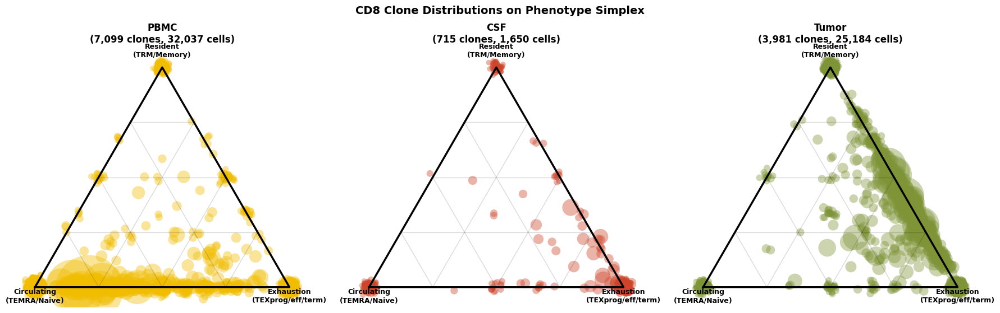

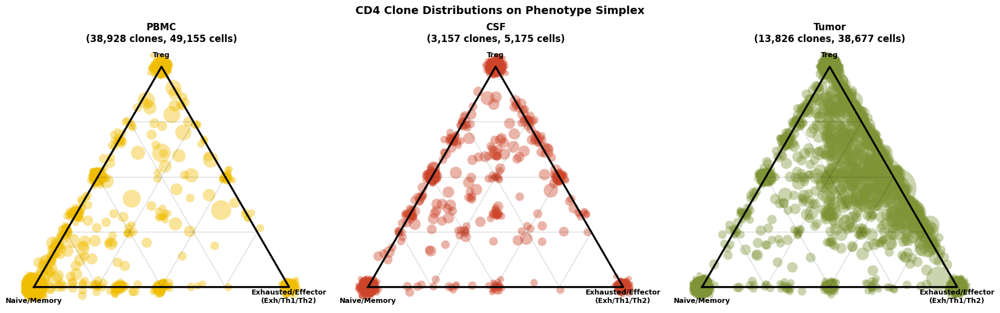

In [85]:


import matplotlib.pyplot as plt
import numpy as np
import pandas as pd


def freq_to_size_scaling(freq, a, b):
    return a * (freq ** (1 / b))


def bary_to_cart(a, b, c):
    total = a + b + c
    a, b, c = a / total, b / total, c / total
    x = 0.5 * (2 * b + c)
    y = (np.sqrt(3) / 2) * c
    return x, y


def draw_simplex(ax, title, group_names):
    verts = np.array([[0, 0], [1, 0], [0.5, np.sqrt(3) / 2], [0, 0]])
    ax.plot(verts[:, 0], verts[:, 1], 'k-', linewidth=2.5)
    for f in [0.25, 0.5, 0.75]:
        for i in range(3):
            arr = np.array([0, 0, 0], dtype=float)
            arr[i] = f
            points = []
            for j in range(3):
                if j != i:
                    b_ = arr.copy()
                    b_[j] = 1 - f
                    points.append(bary_to_cart(b_[0], b_[1], b_[2]))
            ax.plot([points[0][0], points[1][0]], [points[0][1], points[1][1]],
                    'k-', alpha=0.15, linewidth=1.0)
    ax.set_xlim(-0.05, 1.05)
    ax.set_ylim(-0.08, np.sqrt(3) / 2 + 0.08)
    ax.set_aspect('equal')
    ax.axis('off')
    ax.set_title(title, fontsize=12, fontweight='bold')
    ax.text(0, -0.06, group_names[0], ha='center', fontsize=9, fontweight='bold')
    ax.text(1, -0.06, group_names[1], ha='center', fontsize=9, fontweight='bold')
    ax.text(0.5, np.sqrt(3) / 2 + 0.04, group_names[2], ha='center', fontsize=9, fontweight='bold')


def plot_clone_simplex(
    adata,
    phenotype_groups,
    lineage="CD8",
    phenotype_key="phenotype",
    clone_key="trb",
    tissue_key="tissue",
    tissues=("PBMC", "CSF", "TP"),
    tissue_labels=("PBMC", "CSF", "Tumor"),
    tissue_colors=None,
    a=3, b=2,
    alpha=0.4,
    jitter=0.012,
    remove_switching=True,
    title=None,
    seed=42,
):
    if tissue_colors is None:
        tissue_colors = dict(zip(tissues, ["#4A90D9", "#50C878", "#D94A4A"]))
    if title is None:
        title = lineage

    tcr = adata.obs[adata.obs[clone_key].notna()].copy()
    tcr[tissue_key] = tcr[tissue_key].astype(str)
    tcr[phenotype_key] = tcr[phenotype_key].astype(str)
    tcr[clone_key] = tcr[clone_key].astype(str)

    tcr["_lineage"] = tcr[phenotype_key].apply(lambda x: "CD8" if "CD8" in x else "CD4")
    tcr["_pheno_short"] = (tcr[phenotype_key]
        .str.replace("CD8_Activated_", "", regex=False)
        .str.replace("CD8_Quiescent_", "", regex=False)
        .str.replace("CD4_", "", regex=False))

    if remove_switching:
        cl = tcr.groupby(clone_key)["_lineage"].nunique()
        tcr = tcr[~tcr[clone_key].isin(cl[cl > 1].index)]

    tcr = tcr[tcr["_lineage"] == lineage]

    cts = (tcr.groupby([clone_key, tissue_key, "_pheno_short"])
        .size().reset_index(name="n"))
    totals = cts.groupby([clone_key, tissue_key])["n"].transform("sum")
    cts["frac"] = cts["n"] / totals

    group_names = list(phenotype_groups.keys())
    pheno_to_vertex = {}
    for i, phenos in enumerate(phenotype_groups.values()):
        for p in phenos:
            pheno_to_vertex[p] = i

    records = []
    for (clone, tissue), grp in cts.groupby([clone_key, tissue_key]):
        coords = [0.0, 0.0, 0.0]
        for _, row in grp.iterrows():
            vi = pheno_to_vertex.get(row["_pheno_short"])
            if vi is not None:
                coords[vi] += row["frac"]
        s = sum(coords)
        if s > 0:
            coords = [c / s for c in coords]
        records.append({clone_key: clone, tissue_key: tissue,
                        "v0": coords[0], "v1": coords[1], "v2": coords[2],
                        "n_cells": grp["n"].sum()})

    df = pd.DataFrame(records)
    rng = np.random.default_rng(seed)

    fig, axes = plt.subplots(1, len(tissues), figsize=(6 * len(tissues), 6))
    if len(tissues) == 1:
        axes = [axes]

    for ax, tissue, tlabel in zip(axes, tissues, tissue_labels):
        sub = df[df[tissue_key] == tissue]
        n_clones = len(sub)
        n_cells = int(sub["n_cells"].sum())
        draw_simplex(ax, f"{tlabel}\n({n_clones:,} clones, {n_cells:,} cells)", group_names)

        if len(sub) == 0:
            continue

        x, y = bary_to_cart(sub["v0"].values, sub["v1"].values, sub["v2"].values)
        sizes = freq_to_size_scaling(sub["n_cells"].values.astype(float), a, b)

        x_jit = x + rng.normal(0, jitter, len(x))
        y_jit = y + rng.normal(0, jitter, len(y))

        ax.scatter(x_jit, y_jit, s=sizes, c=tissue_colors[tissue], alpha=alpha, edgecolors='none')

    plt.suptitle(f"{title} Clone Distributions on Phenotype Simplex",
                 fontsize=14, fontweight='bold')
    plt.tight_layout()
    plt.show()

    return df


cd8_groups = {
    "Circulating\n(TEMRA/Naive)": ["TEMRA", "Naive"],
    "Exhaustion\n(TEXprog/eff/term)": ["TEXprog", "TEXeff", "TEXterm"],
    "Resident\n(TRM/Memory)": ["TRM", "Memory"],
}

cd4_groups = {
    "Naive/Memory": ["Naive_Memory"],
    "Exhausted/Effector\n(Exh/Th1/Th2)": ["Exhausted", "Th1_polarized", "Th2_polarized"],
    "Treg": ["Treg"],
}

tissue_colors = {'CSF': '#cd442a', 'PBMC': '#f0bd00', 'TP': '#7e9437'}
cd8_df = plot_clone_simplex(adata, cd8_groups, tissue_colors=tissue_colors, lineage="CD8", a=50, b=1.8)
cd4_df = plot_clone_simplex(adata, cd4_groups, tissue_colors=tissue_colors, lineage="CD4", a=50, b=1.8)

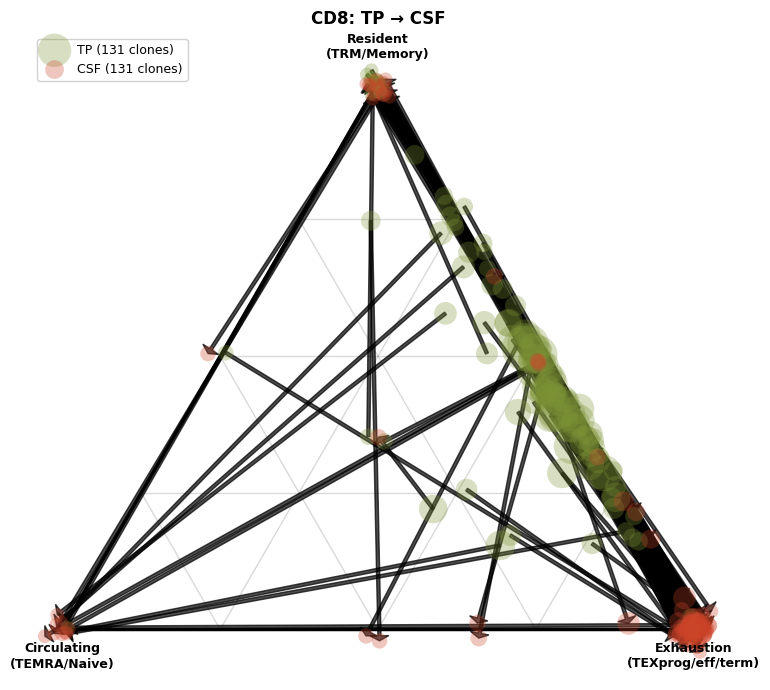

,trb,tissue,v0,v1,v2,n_cells
0,CAIRSFPPYEQYF,CSF,0.000000,1.000000,0.000000,1
1,CAIRSFPPYEQYF,TP,0.000000,0.666667,0.333333,6
2,CAISESKASGDDNEQFF,CSF,0.000000,1.000000,0.000000,2
3,CAISESKASGDDNEQFF,TP,0.037037,0.555556,0.407407,27
4,CAISESVGIGTEAFF,CSF,0.000000,1.000000,0.000000,1
...,...,...,...,...,...,...
257,CSVTSVGQGDEQFF,TP,0.000000,0.500000,0.500000,2
258,CSVVGGNTEAFF,CSF,0.333333,0.333333,0.333333,3
259,CSVVGGNTEAFF,TP,0.289474,0.486842,0.223684,76
260,CSVVPKDRGLLYEQYF,CSF,0.000000,1.000000,0.000000,1


In [89]:
def plot_clone_transitions(
    adata,
    phenotype_groups,
    tissue_from,
    tissue_to,
    lineage="CD8",
    phenotype_key="phenotype",
    clone_key="trb",
    tissue_key="tissue",
    tissue_labels=None,
    clone_subset=None,
    a=3, b=2,
    alpha=0.3,
    jitter=0.012,
    arrow_color="black",
    arrow_alpha=0.15,
    arrow_width=0.003,
    arrow_head_width=0.012,
    arrow_head_length=0.008,
    point_color_from="#4A90D9",
    point_color_to="#D94A4A",
    remove_switching=True,
    title=None,
    seed=42,
    figsize=(8, 7),
):
    if tissue_labels is None:
        tissue_labels = (tissue_from, tissue_to)
    if title is None:
        title = f"{lineage}: {tissue_labels[0]} → {tissue_labels[1]}"

    tcr = adata.obs[adata.obs[clone_key].notna()].copy()
    tcr[tissue_key] = tcr[tissue_key].astype(str)
    tcr[phenotype_key] = tcr[phenotype_key].astype(str)
    tcr[clone_key] = tcr[clone_key].astype(str)

    tcr["_lineage"] = tcr[phenotype_key].apply(lambda x: "CD8" if "CD8" in x else "CD4")
    tcr["_pheno_short"] = (tcr[phenotype_key]
        .str.replace("CD8_Activated_", "", regex=False)
        .str.replace("CD8_Quiescent_", "", regex=False)
        .str.replace("CD4_", "", regex=False))

    if remove_switching:
        cl = tcr.groupby(clone_key)["_lineage"].nunique()
        tcr = tcr[~tcr[clone_key].isin(cl[cl > 1].index)]

    tcr = tcr[tcr["_lineage"] == lineage]
    tcr = tcr[tcr[tissue_key].isin([tissue_from, tissue_to])]

    clone_tissues = tcr.groupby(clone_key)[tissue_key].apply(set)
    shared = clone_tissues[clone_tissues.apply(lambda s: tissue_from in s and tissue_to in s)].index

    if clone_subset is not None:
        shared = shared.intersection(pd.Index([str(c) for c in clone_subset]))

    tcr = tcr[tcr[clone_key].isin(shared)]

    cts = (tcr.groupby([clone_key, tissue_key, "_pheno_short"])
        .size().reset_index(name="n"))
    totals = cts.groupby([clone_key, tissue_key])["n"].transform("sum")
    cts["frac"] = cts["n"] / totals

    group_names = list(phenotype_groups.keys())
    pheno_to_vertex = {}
    for i, phenos in enumerate(phenotype_groups.values()):
        for p in phenos:
            pheno_to_vertex[p] = i

    records = []
    for (clone, tissue), grp in cts.groupby([clone_key, tissue_key]):
        coords = [0.0, 0.0, 0.0]
        for _, row in grp.iterrows():
            vi = pheno_to_vertex.get(row["_pheno_short"])
            if vi is not None:
                coords[vi] += row["frac"]
        s = sum(coords)
        if s > 0:
            coords = [c / s for c in coords]
        records.append({clone_key: clone, tissue_key: tissue,
                        "v0": coords[0], "v1": coords[1], "v2": coords[2],
                        "n_cells": grp["n"].sum()})

    df = pd.DataFrame(records)
    df_from = df[df[tissue_key] == tissue_from].set_index(clone_key)
    df_to = df[df[tissue_key] == tissue_to].set_index(clone_key)
    common = df_from.index.intersection(df_to.index)

    rng = np.random.default_rng(seed)

    fig, ax = plt.subplots(1, 1, figsize=figsize)
    draw_simplex(ax, title, group_names)

    x1, y1 = bary_to_cart(df_from.loc[common, "v0"].values,
                           df_from.loc[common, "v1"].values,
                           df_from.loc[common, "v2"].values)
    x2, y2 = bary_to_cart(df_to.loc[common, "v0"].values,
                           df_to.loc[common, "v1"].values,
                           df_to.loc[common, "v2"].values)

    x1_jit = x1 + rng.normal(0, jitter, len(x1))
    y1_jit = y1 + rng.normal(0, jitter, len(y1))
    x2_jit = x2 + rng.normal(0, jitter, len(x2))
    y2_jit = y2 + rng.normal(0, jitter, len(y2))

    sizes_from = freq_to_size_scaling(df_from.loc[common, "n_cells"].values.astype(float), a, b)
    sizes_to = freq_to_size_scaling(df_to.loc[common, "n_cells"].values.astype(float), a, b)

    for i in range(len(common)):
        dx = x2_jit[i] - x1_jit[i]
        dy = y2_jit[i] - y1_jit[i]
        ax.arrow(x1_jit[i], y1_jit[i], dx, dy,
                 width=arrow_width, head_width=arrow_head_width,
                 head_length=arrow_head_length,
                 fc=arrow_color, ec=arrow_color, alpha=arrow_alpha,
                 length_includes_head=True, zorder=1)

    ax.scatter(x1_jit, y1_jit, s=sizes_from, c=point_color_from, alpha=alpha,
               edgecolors='none', zorder=2, label=f"{tissue_labels[0]} ({len(common)} clones)")
    ax.scatter(x2_jit, y2_jit, s=sizes_to, c=point_color_to, alpha=alpha,
               edgecolors='none', zorder=2, label=f"{tissue_labels[1]} ({len(common)} clones)")

    ax.legend(loc='upper left', framealpha=0.9, fontsize=9)
    plt.tight_layout()
    plt.show()

    return df

plot_clone_transitions(adata, cd8_groups, "TP", "CSF", lineage="CD8",
                       tissue_labels=("TP", "CSF"),
                        arrow_color="black",
                        arrow_alpha=.7,
                        arrow_width=0.005,
                        arrow_head_width=0.03,
                        arrow_head_length=0.008,
                        point_color_from=tissue_colors["TP"],
                        point_color_to=tissue_colors["CSF"],
                        a=100, b=3)

Remaining switching clones: 0
Shared clones: 3162
Cells from shared clones: 54622

CD8 PBMC → Tumor: 815 shared clones
Counts:
TP       Memory  Naive  TEMRA  TEXeff  TEXprog  TEXterm  TRM
PBMC                                                        
Memory       13      6      0      18        6       16   14
Naive        11      8      0       8       13       13   10
TEMRA        25     10     22     100        5      111  109
TEXeff       20      5      1      40        5       45   49
TEXprog       7     16      0      11       15       10   13
TEXterm       2      2      1      12        3       27   13

Row-normalized:
TP       Memory  Naive  TEMRA  TEXeff  TEXprog  TEXterm   TRM
PBMC                                                         
Memory     0.18   0.08   0.00    0.25     0.08     0.22  0.19
Naive      0.17   0.13   0.00    0.13     0.21     0.21  0.16
TEMRA      0.07   0.03   0.06    0.26     0.01     0.29  0.29
TEXeff     0.12   0.03   0.01    0.24     0.03     0.27  0

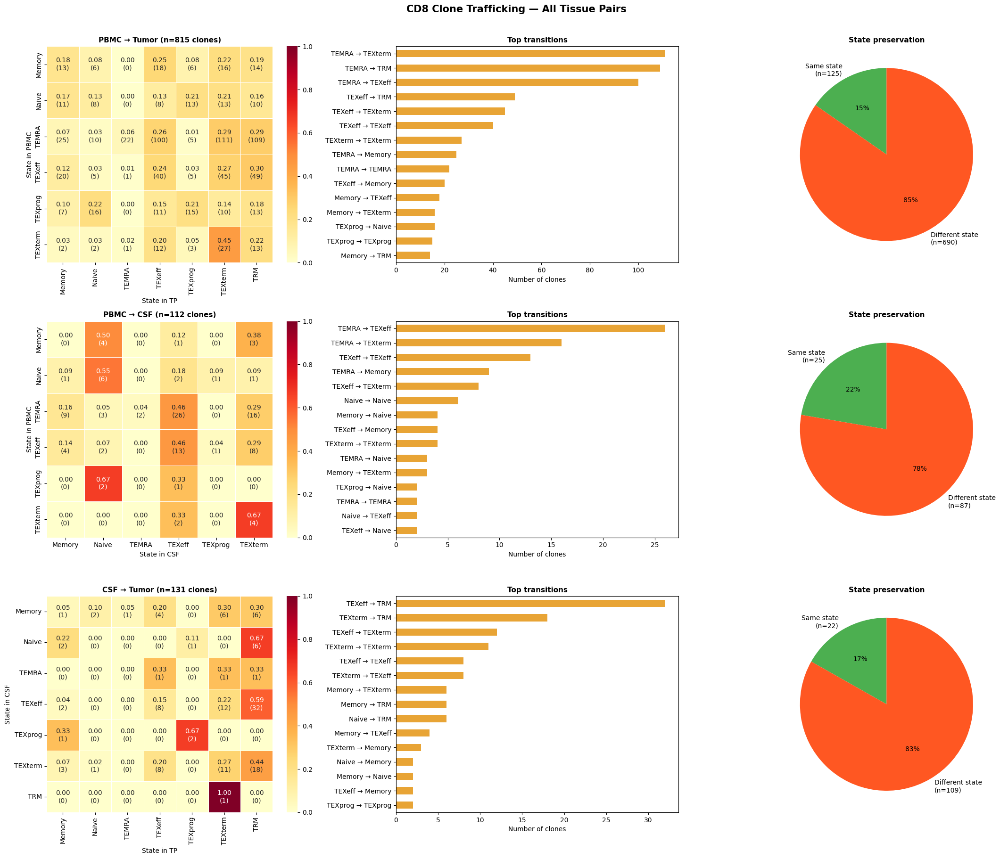


CD8 3-compartment trajectories (90 clones):
trajectory
TEMRA → TEXeff → TRM           18
TEMRA → TEXterm → TEXterm       6
TEMRA → TEXeff → TEXterm        6
TEXeff → TEXeff → TRM           6
TEMRA → TEXterm → TRM           4
TEXeff → TEXterm → TEXeff       4
TEXterm → TEXterm → TEXterm     3
TEMRA → Memory → TEXeff         3
TEXeff → TEXeff → TEXeff        3
TEXeff → TEXterm → TRM          3
TEMRA → Memory → TRM            3
TEXeff → Memory → TEXterm       2
TEXeff → TEXeff → TEXterm       2
Memory → Naive → Memory         2
TEXeff → Naive → TRM            2
TEMRA → TEXterm → Memory        2
TEMRA → TEXterm → TEXeff        2
TEMRA → Naive → TRM             2
TEXeff → Memory → Memory        1
TEXterm → TEXeff → TRM          1
Name: count, dtype: int64

State preservation:
  All 3 same: 6 (7%)
  PBMC=CSF:   16 (18%)
  CSF=TP:     15 (17%)
  PBMC=TP:    15 (17%)


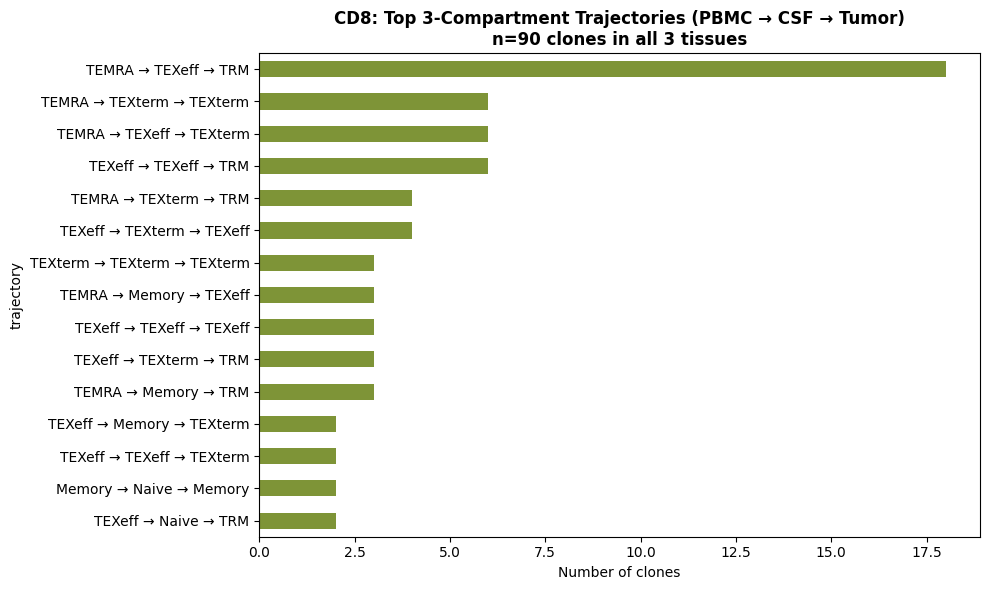


CD4 PBMC → Tumor: 1791 shared clones
Counts:
TP             Exhausted  Naive_Memory  Th1_polarized  Th2_polarized  Treg
PBMC                                                                      
Exhausted              1             1              3              0    10
Naive_Memory          31           792            161             11   511
Th1_polarized          2            11             10              0    22
Th2_polarized          0             3              0              0     5
Treg                   7            36             18              1   155

Row-normalized:
TP             Exhausted  Naive_Memory  Th1_polarized  Th2_polarized  Treg
PBMC                                                                      
Exhausted           0.07          0.07           0.20           0.00  0.67
Naive_Memory        0.02          0.53           0.11           0.01  0.34
Th1_polarized       0.04          0.24           0.22           0.00  0.49
Th2_polarized       0.00          0.3

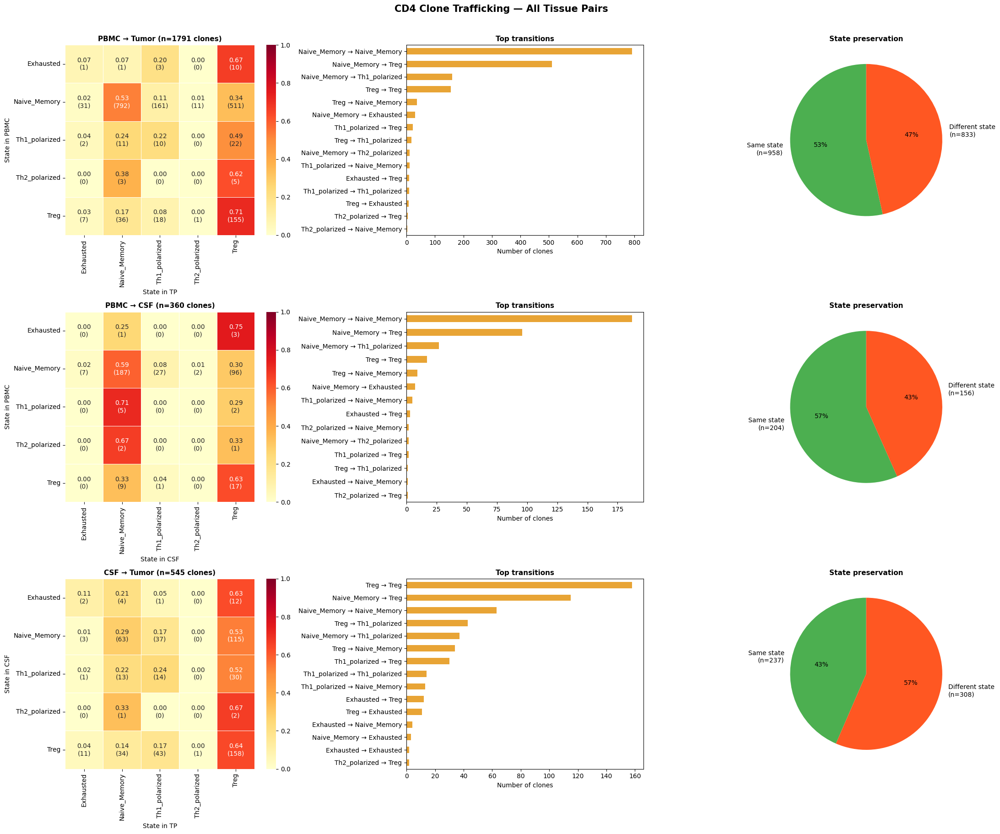


CD4 3-compartment trajectories (206 clones):
trajectory
Naive_Memory → Naive_Memory → Treg              49
Naive_Memory → Treg → Treg                      41
Naive_Memory → Naive_Memory → Naive_Memory      27
Naive_Memory → Th1_polarized → Treg             15
Naive_Memory → Treg → Th1_polarized             13
Treg → Treg → Treg                              12
Naive_Memory → Naive_Memory → Th1_polarized     12
Naive_Memory → Treg → Naive_Memory              11
Naive_Memory → Th1_polarized → Th1_polarized     6
Treg → Naive_Memory → Treg                       3
Naive_Memory → Th1_polarized → Naive_Memory      2
Naive_Memory → Exhausted → Treg                  2
Th1_polarized → Naive_Memory → Treg              1
Treg → Treg → Th1_polarized                      1
Th2_polarized → Naive_Memory → Treg              1
Treg → Naive_Memory → Naive_Memory               1
Naive_Memory → Exhausted → Exhausted             1
Treg → Treg → Naive_Memory                       1
Naive_Memory → Th2_polari

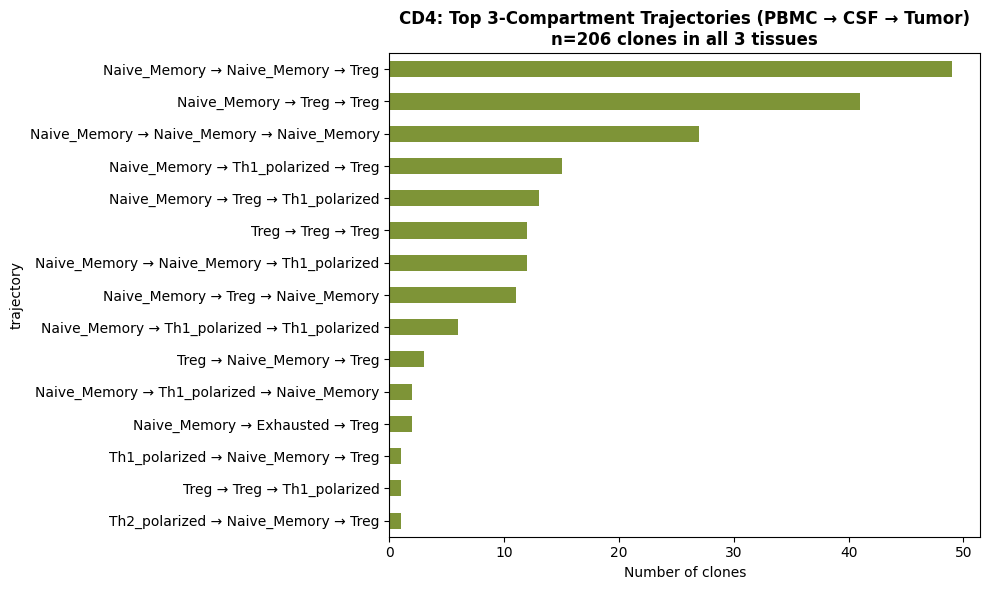


=== Directionality (cell count dominance) ===

CD8 PBMC → Tumor (815 clones):
  PBMC-dominant: 315 (39%)
  TP-dominant:  297 (36%)
  Equal:         203 (25%)

CD8 PBMC → CSF (112 clones):
  PBMC-dominant: 85 (76%)
  CSF-dominant:  9 (8%)
  Equal:         18 (16%)

CD8 CSF → Tumor (131 clones):
  CSF-dominant: 3 (2%)
  TP-dominant:  113 (86%)
  Equal:         15 (11%)

CD4 PBMC → Tumor (1791 clones):
  PBMC-dominant: 466 (26%)
  TP-dominant:  512 (29%)
  Equal:         813 (45%)

CD4 PBMC → CSF (360 clones):
  PBMC-dominant: 115 (32%)
  CSF-dominant:  85 (24%)
  Equal:         160 (44%)

CD4 CSF → Tumor (545 clones):
  CSF-dominant: 35 (6%)
  TP-dominant:  366 (67%)
  Equal:         144 (26%)


In [91]:
import logging
logging.getLogger('matplotlib').setLevel(logging.WARNING)

import pandas as pd
import numpy as np
import matplotlib.pyplot as plt
import seaborn as sns

tcr = adata[adata.obs["trb"].notna()].copy()
tcr.obs["level1"] = tcr.obs["phenotype"].apply(lambda x: "CD8" if "CD8" in x else "CD4")
tcr.obs["pheno_short"] = (tcr.obs["phenotype"]
    .str.replace("CD8_Activated_", "")
    .str.replace("CD8_Quiescent_", "")
    .str.replace("CD4_", ""))
tcr.obs["tissue"] = tcr.obs["tissue"].astype(str)

clone_lineage = tcr.obs.groupby("trb")["level1"].nunique()
remaining_switching = (clone_lineage > 1).sum()
print(f"Remaining switching clones: {remaining_switching}")

clone_tissues = tcr.obs.groupby("trb")["tissue"].nunique()
shared_clones = clone_tissues[clone_tissues >= 2].index
shared = tcr[tcr.obs["trb"].isin(shared_clones)].copy()

if remaining_switching > 0:
    still_switching = clone_lineage[clone_lineage > 1].index
    shared = shared[~shared.obs["trb"].isin(still_switching)]

print(f"Shared clones: {shared.obs['trb'].nunique()}")
print(f"Cells from shared clones: {len(shared)}")

TISSUE_PAIRS = [("PBMC", "TP"), ("PBMC", "CSF"), ("CSF", "TP")]
PAIR_LABELS = {"PBMC_TP": "PBMC → Tumor", "PBMC_CSF": "PBMC → CSF", "CSF_TP": "CSF → Tumor"}

for lineage in ["CD8", "CD4"]:
    lin = shared[shared.obs["level1"] == lineage].copy()
    lin_tc = lin.obs.groupby("trb")["tissue"].nunique()
    lin_shared = lin_tc[lin_tc >= 2].index
    lin = lin[lin.obs["trb"].isin(lin_shared)]

    cs = (lin.obs.groupby(["trb", "tissue"])["pheno_short"]
        .agg(lambda x: x.mode().iloc[0] if len(x) > 0 else None)
        .unstack(fill_value=None))

    # --- Pairwise transition matrices ---
    fig, axes = plt.subplots(len(TISSUE_PAIRS), 3, figsize=(22, 6 * len(TISSUE_PAIRS)))

    for row, (t1, t2) in enumerate(TISSUE_PAIRS):
        if t1 not in cs.columns or t2 not in cs.columns:
            for col in range(3):
                axes[row, col].text(0.5, 0.5, f"No {t1} or {t2} data",
                                     ha='center', va='center', transform=axes[row, col].transAxes)
                axes[row, col].axis('off')
            continue

        pair = cs[cs[t1].notna() & cs[t2].notna()].copy()
        if len(pair) == 0:
            for col in range(3):
                axes[row, col].axis('off')
            continue

        pair_key = f"{t1}_{t2}"
        label = PAIR_LABELS.get(pair_key, f"{t1} → {t2}")

        trans_norm = pd.crosstab(pair[t1], pair[t2], normalize="index")
        trans_counts = pd.crosstab(pair[t1], pair[t2])

        # Annotate with both percentage and count
        annot = trans_norm.copy().astype(str)
        for i in range(trans_norm.shape[0]):
            for j in range(trans_norm.shape[1]):
                annot.iloc[i, j] = f"{trans_norm.iloc[i, j]:.2f}\n({trans_counts.iloc[i, j]})"

        sns.heatmap(trans_norm, annot=annot, fmt="", cmap="YlOrRd",
                    ax=axes[row, 0], linewidths=0.5, vmin=0, vmax=1)
        axes[row, 0].set_title(f"{label} (n={len(pair)} clones)", fontsize=11, fontweight='bold')
        axes[row, 0].set_ylabel(f"State in {t1}")
        axes[row, 0].set_xlabel(f"State in {t2}")

        patterns = pair.apply(lambda r: f"{r[t1]} → {r[t2]}", axis=1)
        top = patterns.value_counts().head(15)
        top.plot.barh(ax=axes[row, 1], color="#E8A435")
        axes[row, 1].set_title(f"Top transitions", fontsize=11, fontweight='bold')
        axes[row, 1].set_xlabel("Number of clones")
        axes[row, 1].invert_yaxis()

        same = (pair[t1] == pair[t2]).sum()
        diff = (pair[t1] != pair[t2]).sum()
        axes[row, 2].pie([same, diff],
                         labels=[f"Same state\n(n={same})", f"Different state\n(n={diff})"],
                         colors=["#4CAF50", "#FF5722"], autopct="%1.0f%%", startangle=90,
                         textprops={'fontsize': 10})
        axes[row, 2].set_title(f"State preservation", fontsize=11, fontweight='bold')

        print(f"\n{lineage} {label}: {len(pair)} shared clones")
        print("Counts:")
        print(trans_counts)
        print("\nRow-normalized:")
        print(trans_norm.round(2))

    fig.suptitle(f"{lineage} Clone Trafficking — All Tissue Pairs",
                 fontsize=15, fontweight="bold", y=1.01)
    plt.tight_layout()
    plt.savefig(f"{lineage.lower()}_transitions_all_pairs.png", dpi=200,
                bbox_inches='tight', facecolor='white')
    plt.show()

    # --- 3-compartment trajectories ---
    if all(t in cs.columns for t in ["PBMC", "CSF", "TP"]):
        all3 = cs[cs[["PBMC", "CSF", "TP"]].notna().all(axis=1)].copy()
        if len(all3) > 0:
            all3["trajectory"] = all3["PBMC"] + " → " + all3["CSF"] + " → " + all3["TP"]

            # Summarize preservation
            same_all = ((all3["PBMC"] == all3["CSF"]) & (all3["CSF"] == all3["TP"])).sum()
            pbmc_csf_same = (all3["PBMC"] == all3["CSF"]).sum()
            csf_tp_same = (all3["CSF"] == all3["TP"]).sum()
            pbmc_tp_same = (all3["PBMC"] == all3["TP"]).sum()

            print(f"\n{lineage} 3-compartment trajectories ({len(all3)} clones):")
            print(all3["trajectory"].value_counts().head(20))
            print(f"\nState preservation:")
            print(f"  All 3 same: {same_all} ({same_all/len(all3):.0%})")
            print(f"  PBMC=CSF:   {pbmc_csf_same} ({pbmc_csf_same/len(all3):.0%})")
            print(f"  CSF=TP:     {csf_tp_same} ({csf_tp_same/len(all3):.0%})")
            print(f"  PBMC=TP:    {pbmc_tp_same} ({pbmc_tp_same/len(all3):.0%})")

            # Sankey-style summary: group by unique trajectory, show top N
            fig, ax = plt.subplots(figsize=(10, 6))
            top_traj = all3["trajectory"].value_counts().head(15)
            top_traj.plot.barh(ax=ax, color="#7e9437")
            ax.set_title(f"{lineage}: Top 3-Compartment Trajectories (PBMC → CSF → Tumor)\n"
                         f"n={len(all3)} clones in all 3 tissues",
                         fontsize=12, fontweight='bold')
            ax.set_xlabel("Number of clones")
            ax.invert_yaxis()
            plt.tight_layout()
            plt.savefig(f"{lineage.lower()}_3compartment_trajectories.png", dpi=200,
                        bbox_inches='tight', facecolor='white')
            plt.show()

# --- Directionality for all tissue pairs ---
print("\n" + "=" * 60)
print("=== Directionality (cell count dominance) ===")
print("=" * 60)
for lineage in ["CD8", "CD4"]:
    lin = shared[shared.obs["level1"] == lineage]
    cc = lin.obs.groupby(["trb", "tissue"]).size().unstack(fill_value=0)

    for t1, t2 in TISSUE_PAIRS:
        if t1 not in cc.columns or t2 not in cc.columns:
            continue
        both = cc[(cc[t1] > 0) & (cc[t2] > 0)]
        t1_dom = (both[t1] > both[t2]).sum()
        t2_dom = (both[t2] > both[t1]).sum()
        eq = (both[t1] == both[t2]).sum()
        label = PAIR_LABELS.get(f"{t1}_{t2}", f"{t1} vs {t2}")
        print(f"\n{lineage} {label} ({len(both)} clones):")
        print(f"  {t1}-dominant: {t1_dom} ({t1_dom/len(both):.0%})")
        print(f"  {t2}-dominant:  {t2_dom} ({t2_dom/len(both):.0%})")
        print(f"  Equal:         {eq} ({eq/len(both):.0%})")

In [ ]:
adata.write("GBM_TCR_POS_TCELLS.h5ad")